<a href="https://colab.research.google.com/github/mia2465/PMLTermProject/blob/main/VAEtestingLatentSpace.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##### Copyright 2020 The TensorFlow Authors.

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Convolutional Variational Autoencoder

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/cvae">
    <img src="https://www.tensorflow.org/images/tf_logo_32px.png" />
    View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/cvae.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />
    Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/cvae.ipynb">
    <img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />
    View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/cvae.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

This notebook demonstrates how to train a Variational Autoencoder (VAE) ([1](https://arxiv.org/abs/1312.6114), [2](https://arxiv.org/abs/1401.4082)) on the MNIST dataset. A VAE is a probabilistic take on the autoencoder, a model which takes high dimensional input data and compresses it into a smaller representation. Unlike a traditional autoencoder, which maps the input onto a latent vector, a VAE maps the input data into the parameters of a probability distribution, such as the mean and variance of a Gaussian. This approach produces a continuous, structured latent space, which is useful for image generation.

![CVAE image latent space](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/cvae_latent_space.jpg?raw=1)

## Setup

In [1]:
!pip install tensorflow-probability

# to generate gifs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs
#!pip install pydicom

from google.colab import drive
drive.mount('/content/drive')

from IPython import display

import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import tensorflow_probability as tfp
import time
import pandas as pd


  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-9yzt36g8
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-9yzt36g8
  Resolved https://github.com/tensorflow/docs to commit 3eac15bae13ea389957e7eb499252ef5da6c9f01
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-2024.4.30.68232-py3-none-any.whl size=182538 sha256=5215e9da3512ac44b375cab97c3270cd88840f11502bd09246573107dbc43b08
  Stored in directory: /tmp/pip-ephem-wheel-cache-qyg7zodw/wheels/86/0f/1e/3b62293c8ffd0fd5a49508e6871cdb7554abe9c62afd35ec53
Successfully built tensorflow-docs
Mounted at /content/drive


In [2]:
#This is for the set in which 98% of all the CT scans are used for testing
train_dataset = tf.data.Dataset.load('/content/drive/MyDrive/AllDICOM/trainSet128')

In [3]:
#This is for the set in which 98% of all the CT scans are used for training
test_dataset = tf.data.Dataset.load('/content/drive/MyDrive/AllDICOM/testSet128')

In [ ]:
train_dataset = tf.data.Dataset.load('/content/drive/MyDrive/AllDICOM/trainSet128Healthy')

In [ ]:
test_dataset = tf.data.Dataset.load('/content/drive/MyDrive/AllDICOM/testSet128Sick')

## Load the MNIST dataset
Each MNIST image is originally a vector of 784 integers, each of which is between 0-255 and represents the intensity of a pixel. Model each pixel with a Bernoulli distribution in our model, and statically binarize the dataset.

In [4]:
# For 98% data set
train_size =  8,718
batch_size = 32
test_size =  178

In [ ]:
# For healthy vs not
train_size =  5,915
batch_size = 32
test_size =  2,982

## Use *tf.data* to batch and shuffle the data

## Define the encoder and decoder networks with *tf.keras.Sequential*

In this VAE example, use two small ConvNets for the encoder and decoder networks. In the literature, these networks are also referred to as inference/recognition and generative models respectively. Use `tf.keras.Sequential` to simplify implementation. Let $x$ and $z$ denote the observation and latent variable respectively in the following descriptions.

### Encoder network
This defines the approximate posterior distribution $q(z|x)$, which takes as input an observation and outputs a set of parameters for specifying the conditional distribution of the latent representation $z$.
In this example, simply model the distribution as a diagonal Gaussian, and the network outputs the mean and log-variance parameters of a factorized Gaussian.
Output log-variance instead of the variance directly for numerical stability.

### Decoder network
This defines the conditional distribution of the observation $p(x|z)$, which takes a latent sample $z$ as input and outputs the parameters for a conditional distribution of the observation.
Model the latent distribution prior $p(z)$ as a unit Gaussian.

### Reparameterization trick
To generate a sample $z$ for the decoder during training, you can sample from the latent distribution defined by the parameters outputted by the encoder, given an input observation $x$.
However, this sampling operation creates a bottleneck because backpropagation cannot flow through a random node.

To address this, use a reparameterization trick.
In our example, you approximate $z$ using the decoder parameters and another parameter $\epsilon$ as follows:

$$z = \mu + \sigma \odot \epsilon$$

where $\mu$ and $\sigma$ represent the mean and standard deviation of a Gaussian distribution respectively. They can be derived from the decoder output. The $\epsilon$ can be thought of as a random noise used to maintain stochasticity of $z$. Generate $\epsilon$ from a standard normal distribution.

The latent variable $z$ is now generated by a function of $\mu$, $\sigma$ and $\epsilon$, which would enable the model to backpropagate gradients in the encoder through $\mu$ and $\sigma$ respectively, while maintaining stochasticity through $\epsilon$.

### Network architecture
For the encoder network, use two convolutional layers followed by a fully-connected layer. In the decoder network, mirror this architecture by using a fully-connected layer followed by three convolution transpose layers (a.k.a. deconvolutional layers in some contexts). Note, it's common practice to avoid using batch normalization when training VAEs, since the additional stochasticity due to using mini-batches may aggravate instability on top of the stochasticity from sampling.


In [5]:
class CVAE(tf.keras.Model):
  """Convolutional variational autoencoder."""

  def __init__(self, latent_dim):
    super(CVAE, self).__init__()
    self.latent_dim = latent_dim
    self.encoder = tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(128, 128, 1)),
            tf.keras.layers.Conv2D(
                filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
            tf.keras.layers.Flatten(),
            # No activation
            tf.keras.layers.Dense(latent_dim + latent_dim),
        ]
    )

    self.decoder = tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
            tf.keras.layers.Dense(units=32*32*32, activation=tf.nn.relu),
            tf.keras.layers.Reshape(target_shape=(32, 32, 32)),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            # No activation
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=1, padding='same'),
        ]
    )

  @tf.function
  def sample(self, eps=None):
    if eps is None:
      eps = tf.random.normal(shape=(100, self.latent_dim))
    return self.decode(eps, apply_sigmoid=True)

  def encode(self, x):
    mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
    return mean, logvar

  def reparameterize(self, mean, logvar):
    eps = tf.random.normal(shape=mean.shape)
    return eps * tf.exp(logvar * .5) + mean

  def decode(self, z, apply_sigmoid=False):
    logits = self.decoder(z)
    if apply_sigmoid:
      probs = tf.sigmoid(logits)
      return probs
    return logits

## Define the loss function and the optimizer

VAEs train by maximizing the evidence lower bound (ELBO) on the marginal log-likelihood:

$$\log p(x) \ge \text{ELBO} = \mathbb{E}_{q(z|x)}\left[\log \frac{p(x, z)}{q(z|x)}\right].$$

In practice, optimize the single sample Monte Carlo estimate of this expectation:

$$\log p(x| z) + \log p(z) - \log q(z|x),$$
where $z$ is sampled from $q(z|x)$.

Note: You could also analytically compute the KL term, but here you incorporate all three terms in the Monte Carlo estimator for simplicity.

In [6]:
optimizer = tf.keras.optimizers.Adam(1e-4)


def log_normal_pdf(sample, mean, logvar, raxis=1):
  log2pi = tf.math.log(2. * np.pi)
  return tf.reduce_sum(
      -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
      axis=raxis)


def compute_loss(model, x):
  mean, logvar = model.encode(x)
  z = model.reparameterize(mean, logvar)
  x_logit = model.decode(z)
  cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
  logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2, 3])
  logpz = log_normal_pdf(z, 0., 0.)
  logqz_x = log_normal_pdf(z, mean, logvar)
  return -tf.reduce_mean(logpx_z + logpz - logqz_x)


@tf.function
def train_step(model, x, optimizer):
  """Executes one training step and returns the loss.

  This function computes the loss and gradients, and uses the latter to
  update the model's parameters.
  """
  with tf.GradientTape() as tape:
    loss = compute_loss(model, x)
  gradients = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))

## Training

* Start by iterating over the dataset
* During each iteration, pass the image to the encoder to obtain a set of mean and log-variance parameters of the approximate posterior $q(z|x)$
* then apply the *reparameterization trick* to sample from $q(z|x)$
* Finally, pass the reparameterized samples to the decoder to obtain the logits of the generative distribution $p(x|z)$
* Note: Since you use the dataset loaded by keras with 60k datapoints in the training set and 10k datapoints in the test set, our resulting ELBO on the test set is slightly higher than reported results in the literature which uses dynamic binarization of Larochelle's MNIST.

### Generating images

* After training, it is time to generate some images
* Start by sampling a set of latent vectors from the unit Gaussian prior distribution $p(z)$
* The generator will then convert the latent sample $z$ to logits of the observation, giving a distribution $p(x|z)$
* Here, plot the probabilities of Bernoulli distributions


In [7]:
epochs = 3
# set the dimensionality of the latent space to a plane for visualization later
latent_dim = 2
num_examples_to_generate = 16

# keeping the random vector constant for generation (prediction) so
# it will be easier to see the improvement.
random_vector_for_generation = tf.random.normal(
    shape=[num_examples_to_generate, latent_dim])
model = CVAE(latent_dim)

In [8]:
def generate_and_save_images(model, epoch, test_sample):
  mean, logvar = model.encode(test_sample)
  z = model.reparameterize(mean, logvar)
  predictions = model.sample(z)
  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
    plt.subplot(4, 4, i + 1)
    plt.imshow(predictions[i, :, :, 0], cmap='gray')
    plt.axis('off')

  # tight_layout minimizes the overlap between 2 sub-plots
  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

In [9]:
# Pick a sample of the test set for generating output images
assert batch_size >= num_examples_to_generate
for test_batch in test_dataset.take(1):
  test_sample = test_batch[0:num_examples_to_generate, :, :, :]

### Display a generated image from the last training epoch

In [10]:
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

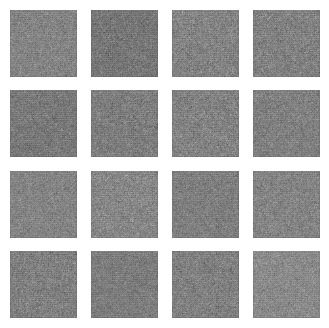

Epoch: 1, Test set ELBO: -7667.57568359375, time elapse for current epoch: 10.236032485961914


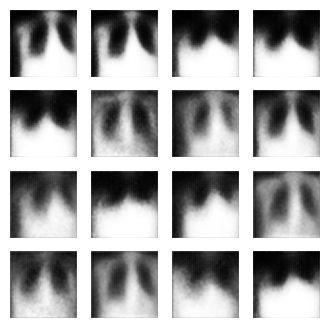

Epoch: 2, Test set ELBO: -6838.56787109375, time elapse for current epoch: 6.558792352676392


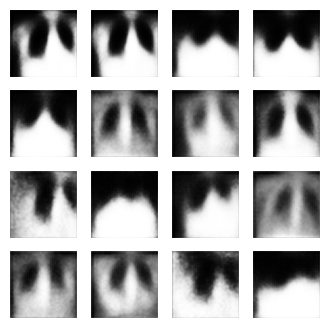

Epoch: 3, Test set ELBO: -6774.34521484375, time elapse for current epoch: 6.638970375061035


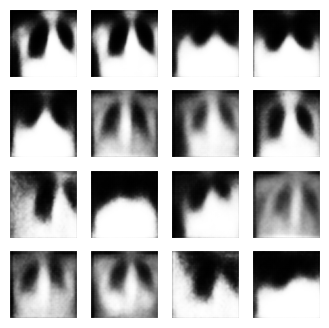

Epoch: 4, Test set ELBO: -6705.30908203125, time elapse for current epoch: 6.753018856048584


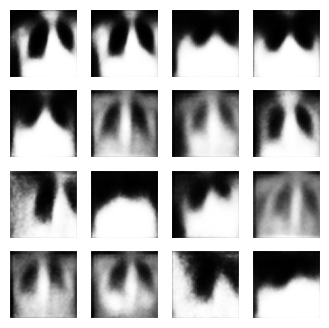

Epoch: 5, Test set ELBO: -6662.98828125, time elapse for current epoch: 6.838924884796143


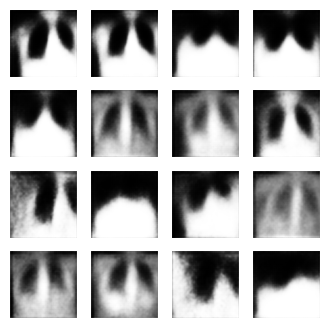

Epoch: 6, Test set ELBO: -6638.328125, time elapse for current epoch: 6.691519737243652


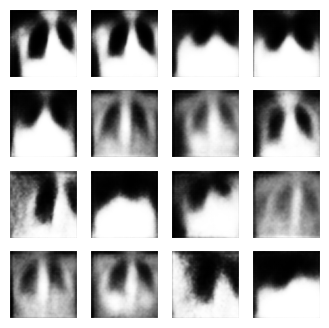

Epoch: 7, Test set ELBO: -6622.59716796875, time elapse for current epoch: 6.644250154495239


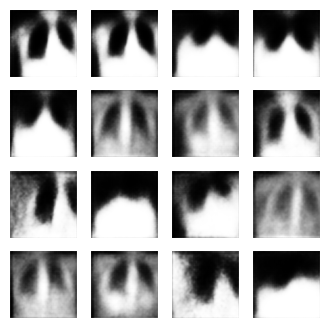

Epoch: 8, Test set ELBO: -6612.32958984375, time elapse for current epoch: 6.532670021057129


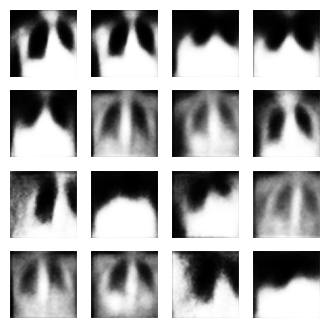

Epoch: 9, Test set ELBO: -6623.509765625, time elapse for current epoch: 6.5002641677856445


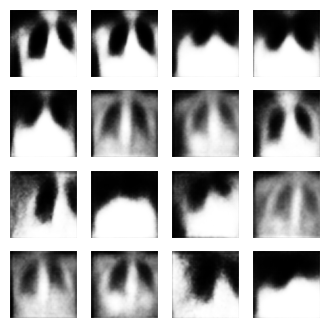

Epoch: 10, Test set ELBO: -6607.77490234375, time elapse for current epoch: 6.481226205825806


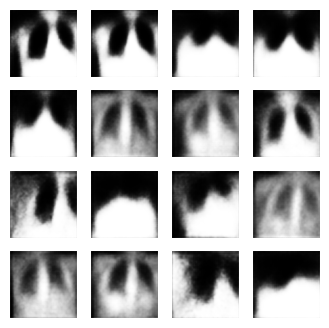

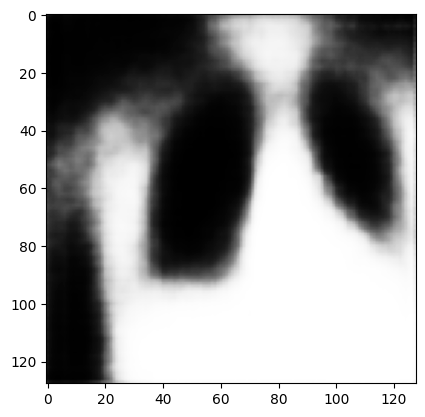

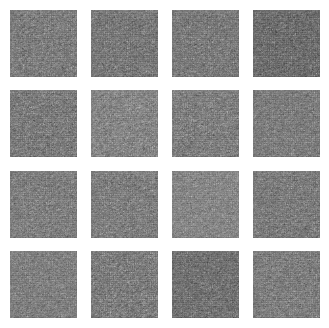

Epoch: 1, Test set ELBO: -7478.68115234375, time elapse for current epoch: 8.772848844528198


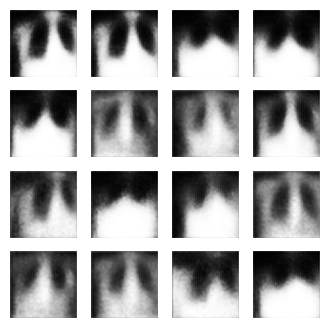

Epoch: 2, Test set ELBO: -6855.474609375, time elapse for current epoch: 6.488585710525513


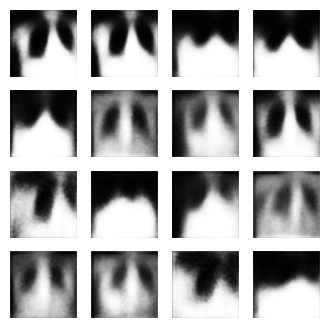

Epoch: 3, Test set ELBO: -6767.94384765625, time elapse for current epoch: 6.5795300006866455


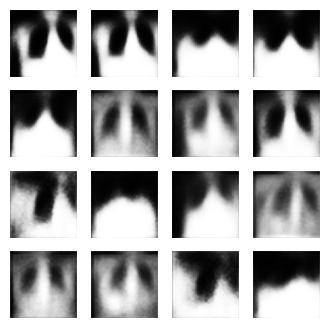

Epoch: 4, Test set ELBO: -6710.31787109375, time elapse for current epoch: 6.6871497631073


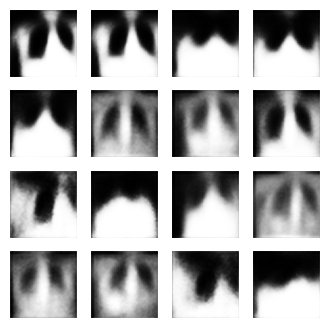

Epoch: 5, Test set ELBO: -6669.49462890625, time elapse for current epoch: 6.779379606246948


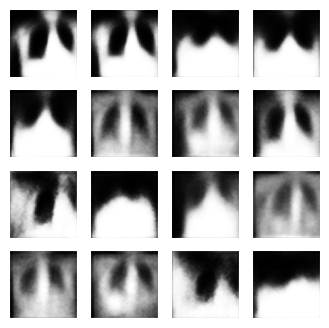

Epoch: 6, Test set ELBO: -6646.54296875, time elapse for current epoch: 6.615879535675049


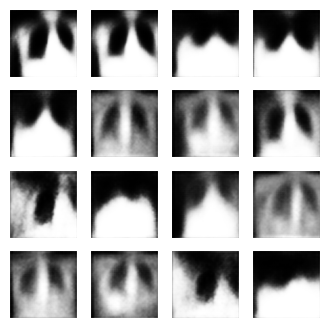

Epoch: 7, Test set ELBO: -6632.94384765625, time elapse for current epoch: 6.575479507446289


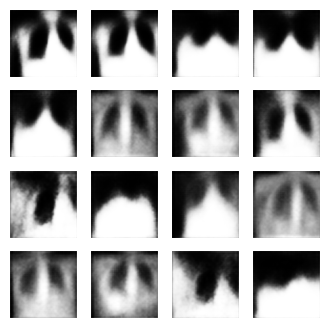

Epoch: 8, Test set ELBO: -6624.58447265625, time elapse for current epoch: 6.5409605503082275


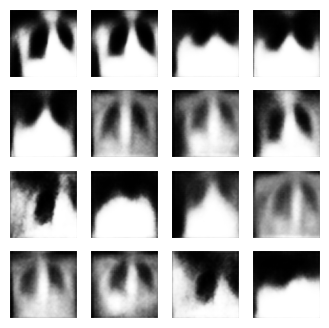

Epoch: 9, Test set ELBO: -6617.12353515625, time elapse for current epoch: 6.531249046325684


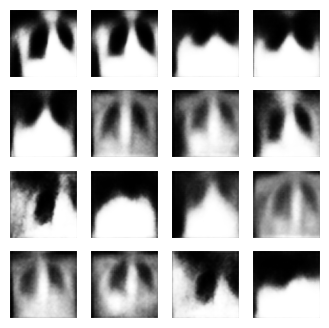

Epoch: 10, Test set ELBO: -6603.94140625, time elapse for current epoch: 6.53880763053894


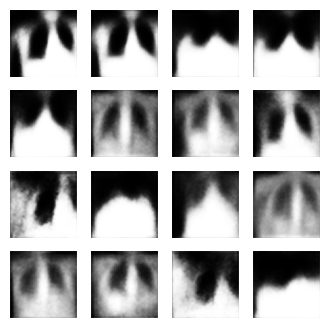

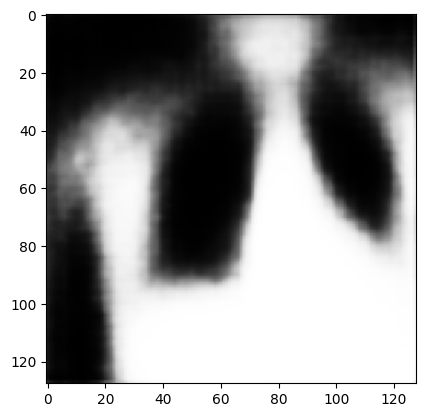

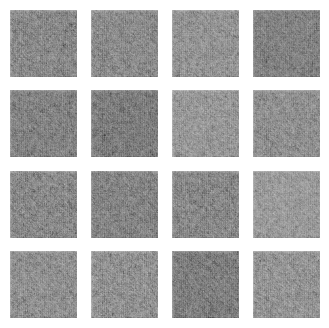

Epoch: 1, Test set ELBO: -7553.66552734375, time elapse for current epoch: 8.689146995544434


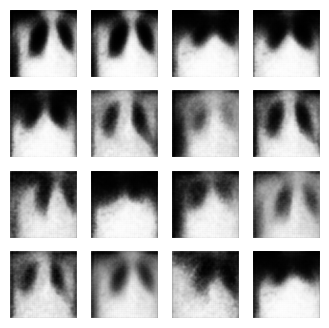

Epoch: 2, Test set ELBO: -6931.84912109375, time elapse for current epoch: 6.549816131591797


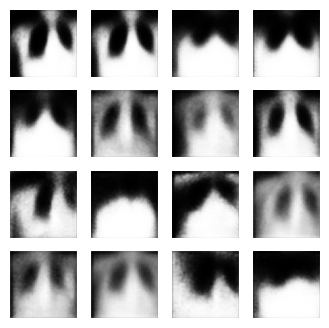

Epoch: 3, Test set ELBO: -6807.9453125, time elapse for current epoch: 6.591501951217651


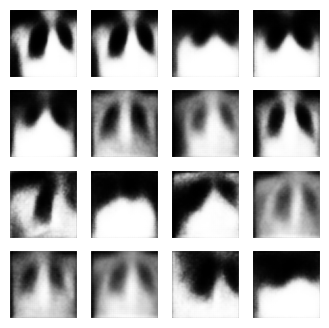

Epoch: 4, Test set ELBO: -6746.66796875, time elapse for current epoch: 6.621165037155151


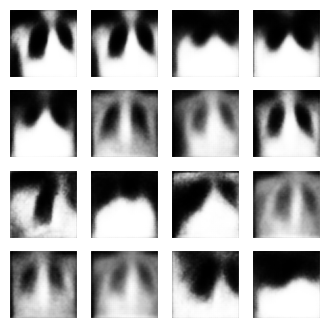

Epoch: 5, Test set ELBO: -6704.16064453125, time elapse for current epoch: 6.670532703399658


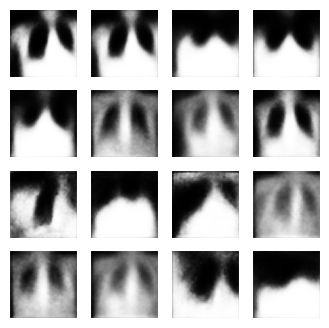

Epoch: 6, Test set ELBO: -6677.302734375, time elapse for current epoch: 6.601453065872192


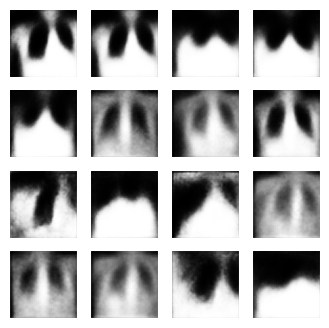

Epoch: 7, Test set ELBO: -6674.51220703125, time elapse for current epoch: 6.601681232452393


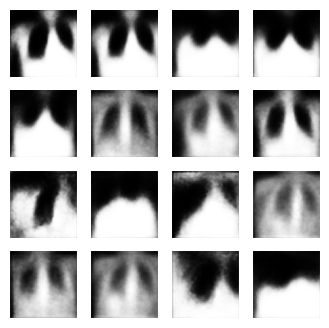

Epoch: 8, Test set ELBO: -6664.06005859375, time elapse for current epoch: 6.57362699508667


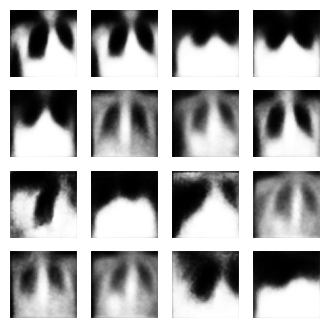

Epoch: 9, Test set ELBO: -6650.85400390625, time elapse for current epoch: 6.540492296218872


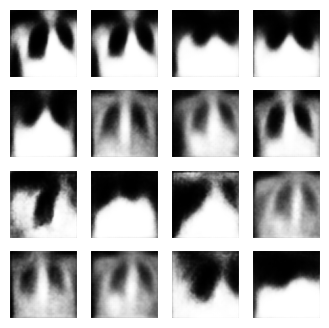

Epoch: 10, Test set ELBO: -6632.06787109375, time elapse for current epoch: 6.58665132522583


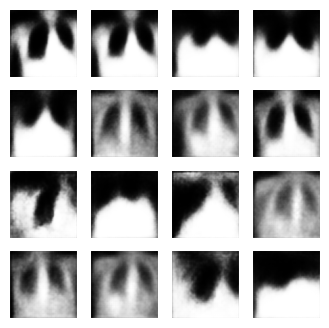

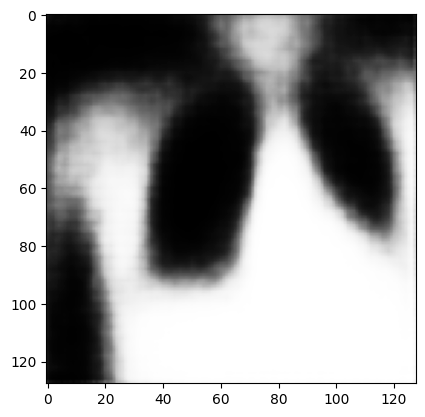

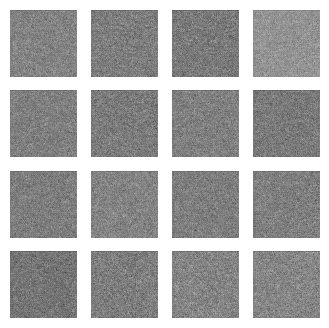

Epoch: 1, Test set ELBO: -7570.88037109375, time elapse for current epoch: 8.709600925445557


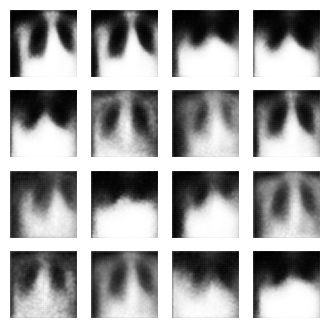

Epoch: 2, Test set ELBO: -6850.251953125, time elapse for current epoch: 10.262045860290527


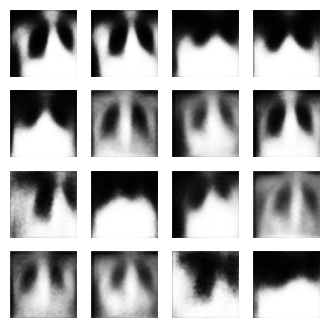

Epoch: 3, Test set ELBO: -6770.83056640625, time elapse for current epoch: 6.649853229522705


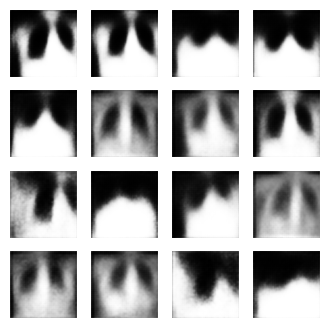

Epoch: 4, Test set ELBO: -6692.935546875, time elapse for current epoch: 6.628324508666992


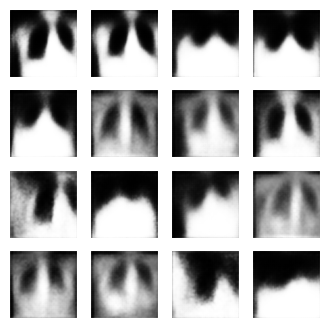

Epoch: 5, Test set ELBO: -6663.30615234375, time elapse for current epoch: 6.673631429672241


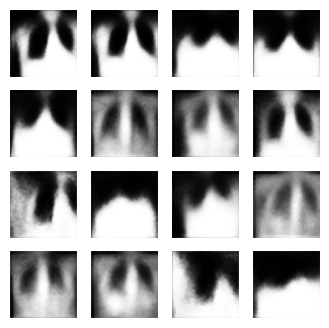

Epoch: 6, Test set ELBO: -6640.35302734375, time elapse for current epoch: 6.749178409576416


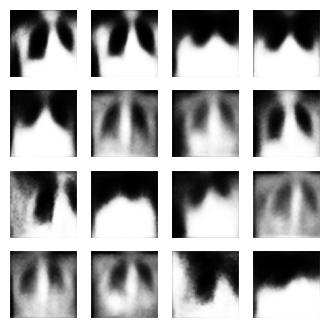

Epoch: 7, Test set ELBO: -6635.22314453125, time elapse for current epoch: 6.603087425231934


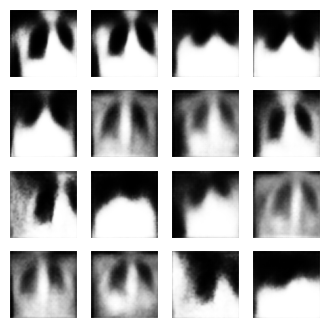

Epoch: 8, Test set ELBO: -6620.26171875, time elapse for current epoch: 6.561575174331665


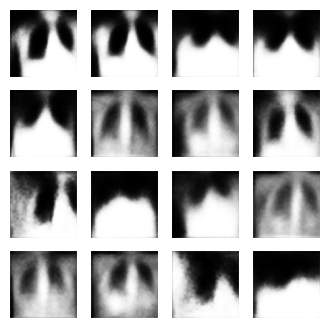

Epoch: 9, Test set ELBO: -6603.26806640625, time elapse for current epoch: 6.559478759765625


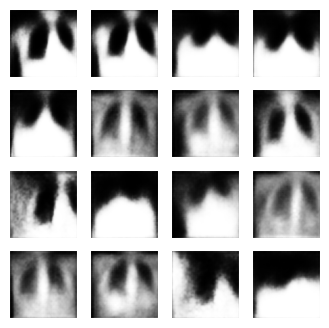

Epoch: 10, Test set ELBO: -6591.33349609375, time elapse for current epoch: 6.5395894050598145


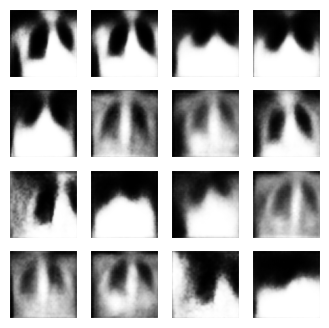

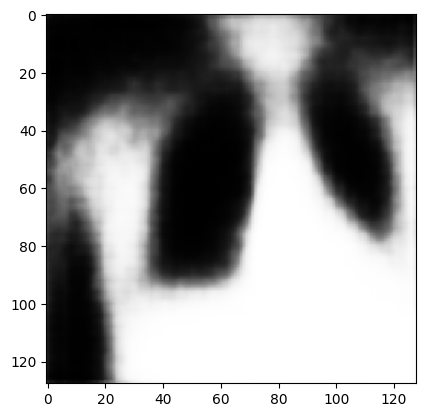

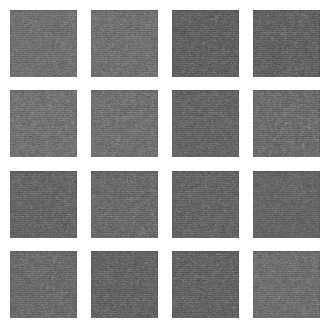

Epoch: 1, Test set ELBO: -7647.26806640625, time elapse for current epoch: 9.533202409744263


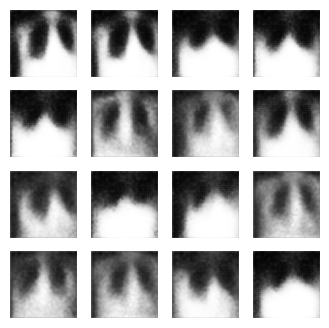

Epoch: 2, Test set ELBO: -6935.90087890625, time elapse for current epoch: 6.5347981452941895


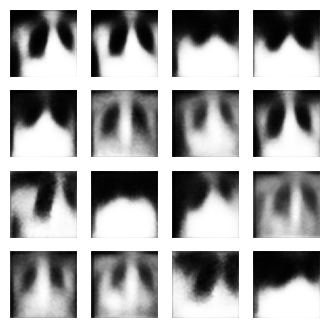

Epoch: 3, Test set ELBO: -6791.41845703125, time elapse for current epoch: 6.629857063293457


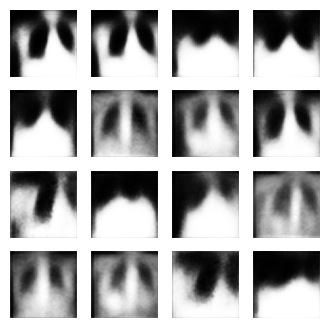

Epoch: 4, Test set ELBO: -6735.97509765625, time elapse for current epoch: 6.800889730453491


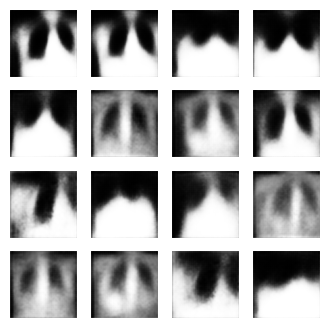

Epoch: 5, Test set ELBO: -6703.55908203125, time elapse for current epoch: 6.687601327896118


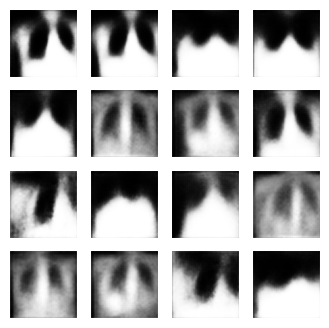

Epoch: 6, Test set ELBO: -6697.751953125, time elapse for current epoch: 6.61853551864624


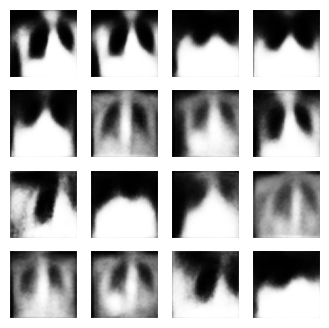

Epoch: 7, Test set ELBO: -6669.787109375, time elapse for current epoch: 6.588487386703491


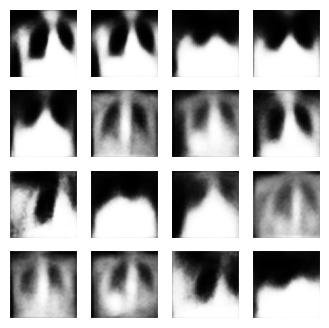

Epoch: 8, Test set ELBO: -6645.84521484375, time elapse for current epoch: 6.561666011810303


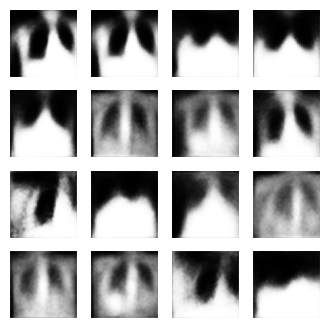

Epoch: 9, Test set ELBO: -6639.294921875, time elapse for current epoch: 6.582703351974487


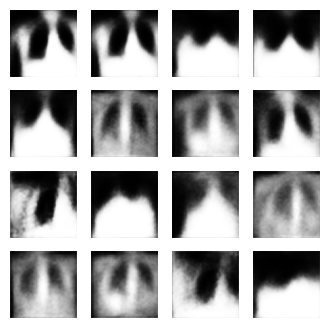

Epoch: 10, Test set ELBO: -6627.09326171875, time elapse for current epoch: 6.543993711471558


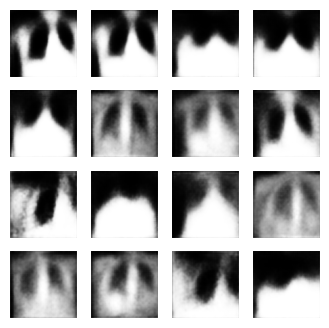

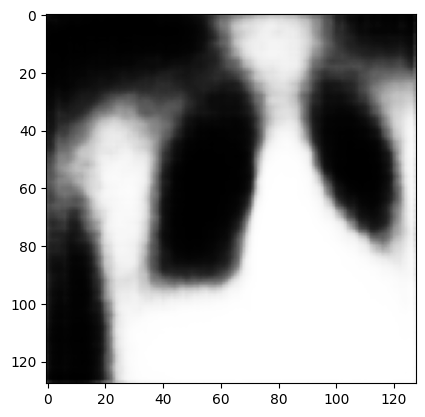

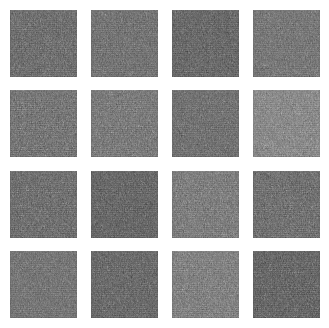

Epoch: 1, Test set ELBO: -7458.45703125, time elapse for current epoch: 10.25489616394043


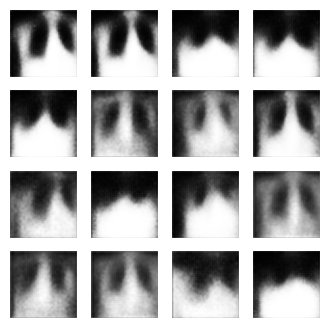

Epoch: 2, Test set ELBO: -6738.244140625, time elapse for current epoch: 6.608100175857544


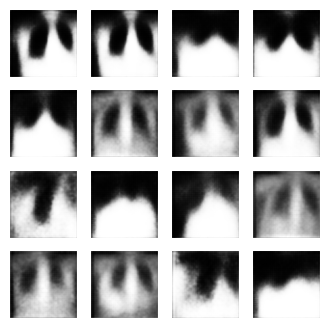

Epoch: 3, Test set ELBO: -6586.248046875, time elapse for current epoch: 6.664826154708862


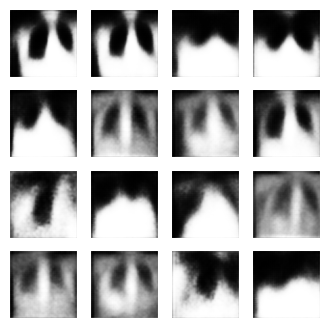

Epoch: 4, Test set ELBO: -6529.4296875, time elapse for current epoch: 6.762336730957031


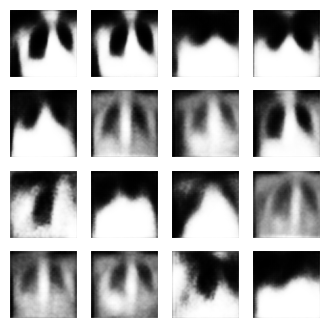

Epoch: 5, Test set ELBO: -6477.57666015625, time elapse for current epoch: 6.77528977394104


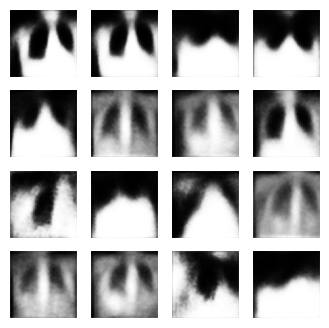

Epoch: 6, Test set ELBO: -6443.478515625, time elapse for current epoch: 6.635692834854126


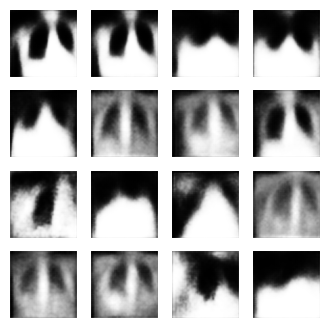

Epoch: 7, Test set ELBO: -6422.587890625, time elapse for current epoch: 6.654920339584351


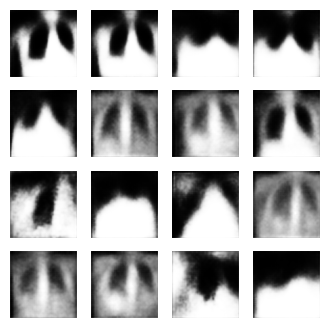

Epoch: 8, Test set ELBO: -6420.10107421875, time elapse for current epoch: 6.572430610656738


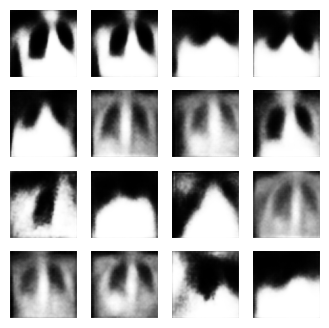

Epoch: 9, Test set ELBO: -6397.54443359375, time elapse for current epoch: 6.566653251647949


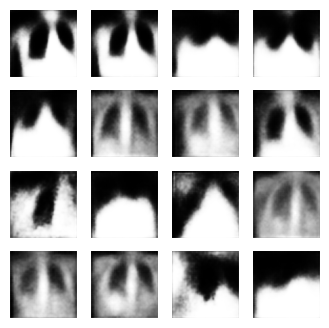

Epoch: 10, Test set ELBO: -6381.39990234375, time elapse for current epoch: 6.558653831481934


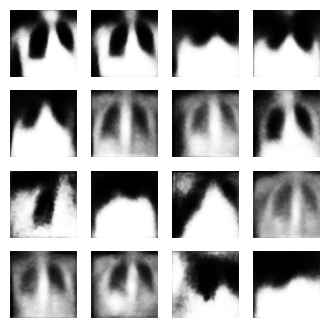

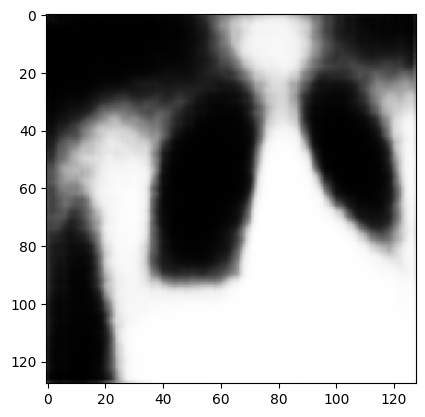

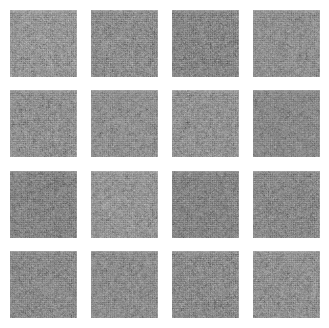

Epoch: 1, Test set ELBO: -7355.20947265625, time elapse for current epoch: 8.793562650680542


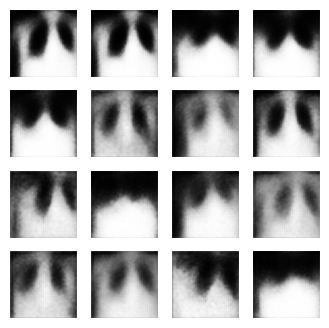

Epoch: 2, Test set ELBO: -6681.43115234375, time elapse for current epoch: 6.57860255241394


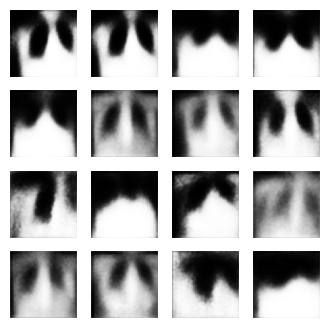

Epoch: 3, Test set ELBO: -6569.68896484375, time elapse for current epoch: 6.659730911254883


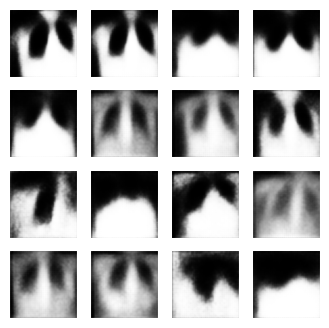

Epoch: 4, Test set ELBO: -6477.58642578125, time elapse for current epoch: 10.261505126953125


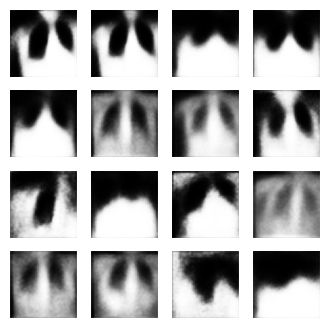

Epoch: 5, Test set ELBO: -6440.72265625, time elapse for current epoch: 6.6823296546936035


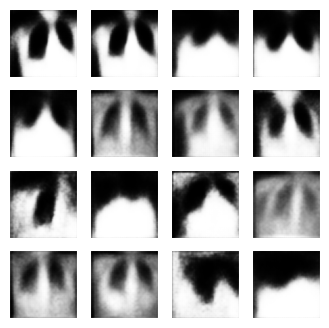

Epoch: 6, Test set ELBO: -6409.26123046875, time elapse for current epoch: 6.616116285324097


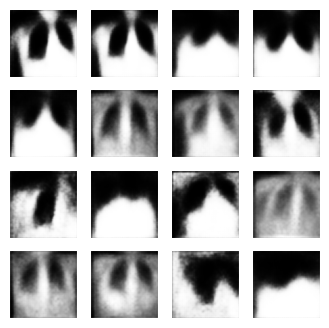

Epoch: 7, Test set ELBO: -6392.59521484375, time elapse for current epoch: 6.629066467285156


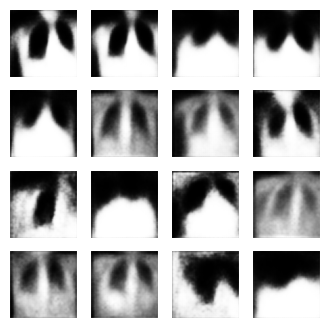

Epoch: 8, Test set ELBO: -6401.33203125, time elapse for current epoch: 6.652591943740845


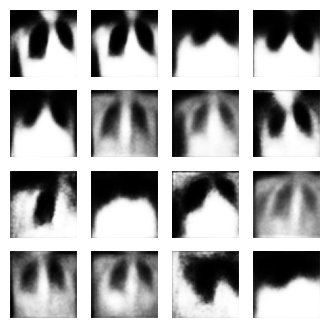

Epoch: 9, Test set ELBO: -6393.10595703125, time elapse for current epoch: 6.594224691390991


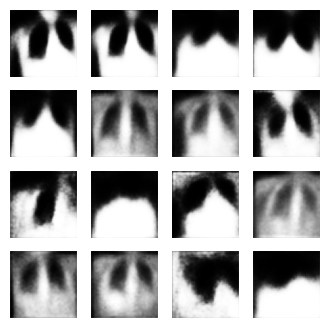

Epoch: 10, Test set ELBO: -6380.01416015625, time elapse for current epoch: 6.607980489730835


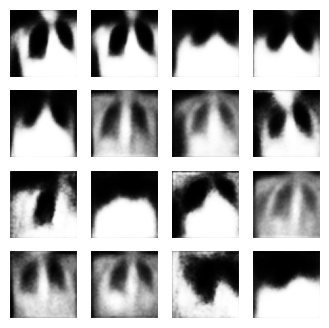

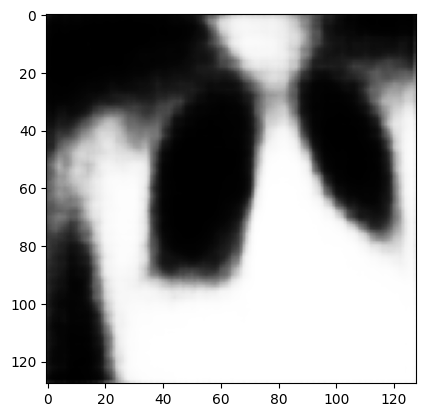

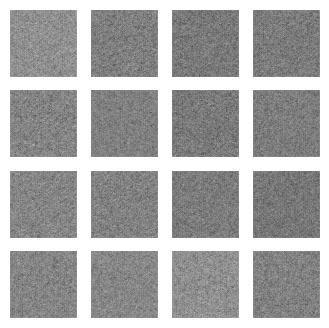

Epoch: 1, Test set ELBO: -7194.49853515625, time elapse for current epoch: 9.699389696121216


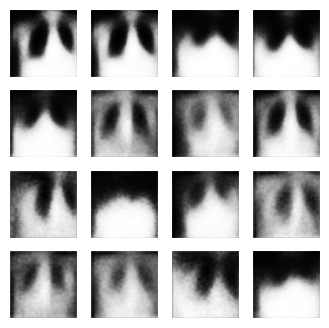

Epoch: 2, Test set ELBO: -6664.55517578125, time elapse for current epoch: 6.584230899810791


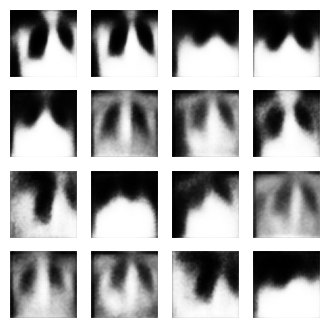

Epoch: 3, Test set ELBO: -6586.673828125, time elapse for current epoch: 6.642213582992554


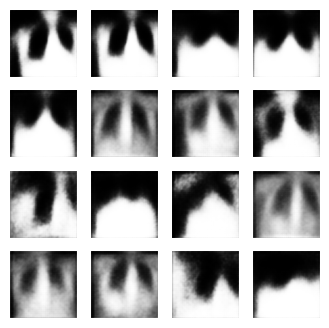

Epoch: 4, Test set ELBO: -6472.89892578125, time elapse for current epoch: 6.67044734954834


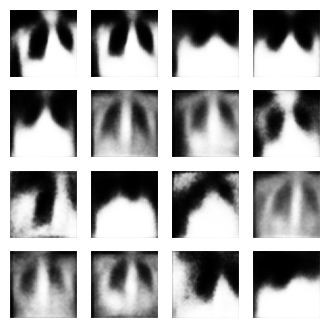

Epoch: 5, Test set ELBO: -6427.32763671875, time elapse for current epoch: 6.663654327392578


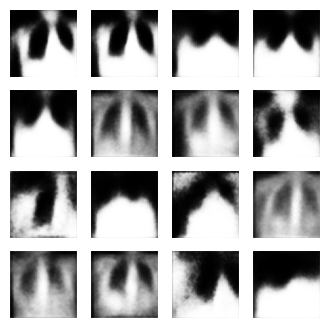

Epoch: 6, Test set ELBO: -6416.47021484375, time elapse for current epoch: 6.710269927978516


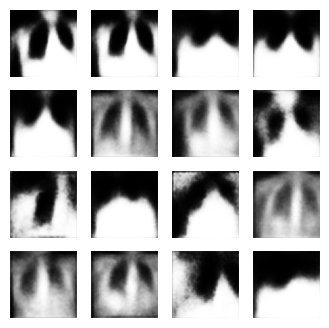

Epoch: 7, Test set ELBO: -6376.47900390625, time elapse for current epoch: 6.629042387008667


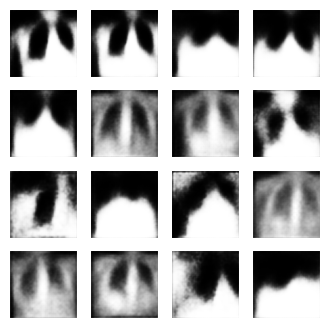

Epoch: 8, Test set ELBO: -6346.26171875, time elapse for current epoch: 6.634664297103882


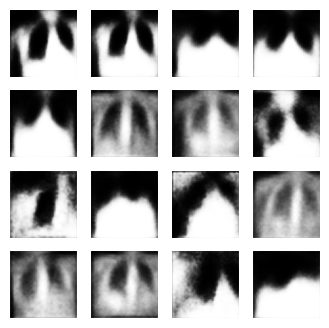

Epoch: 9, Test set ELBO: -6336.29638671875, time elapse for current epoch: 6.631329536437988


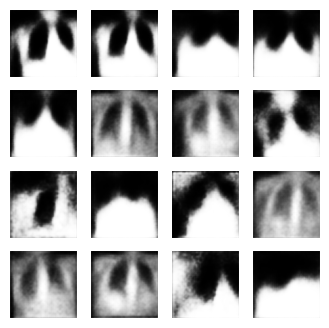

Epoch: 10, Test set ELBO: -6326.94775390625, time elapse for current epoch: 6.621920347213745


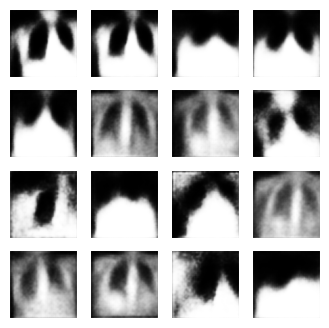

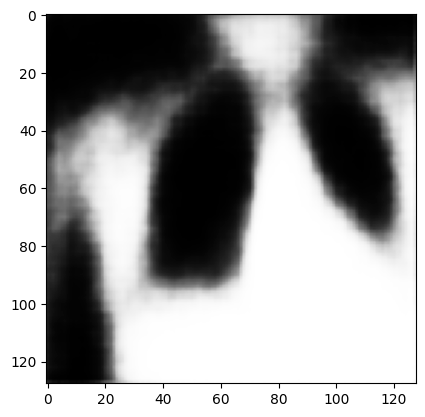

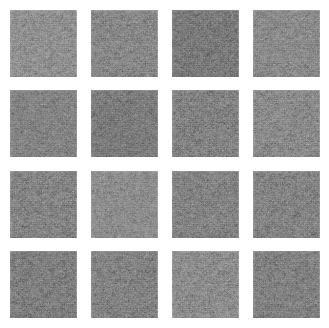

Epoch: 1, Test set ELBO: -7378.00732421875, time elapse for current epoch: 8.795879364013672


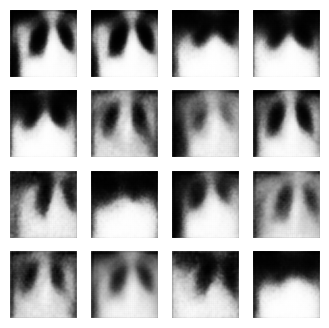

Epoch: 2, Test set ELBO: -6666.50537109375, time elapse for current epoch: 6.58461332321167


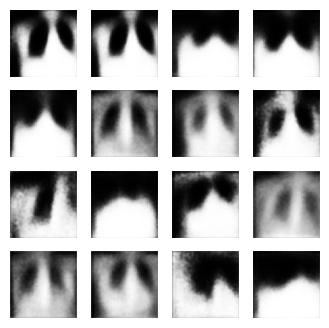

Epoch: 3, Test set ELBO: -6560.31201171875, time elapse for current epoch: 6.667633533477783


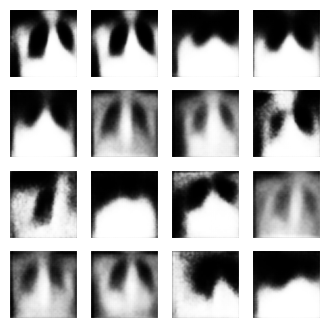

Epoch: 4, Test set ELBO: -6457.248046875, time elapse for current epoch: 6.756953477859497


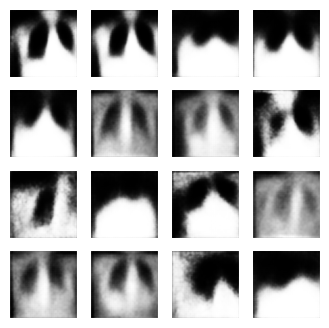

Epoch: 5, Test set ELBO: -6419.74169921875, time elapse for current epoch: 6.699307441711426


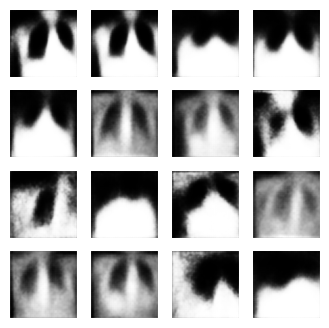

Epoch: 6, Test set ELBO: -6392.22802734375, time elapse for current epoch: 6.637448787689209


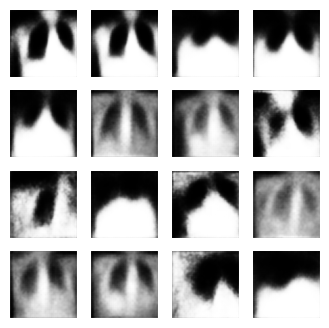

Epoch: 7, Test set ELBO: -6370.75830078125, time elapse for current epoch: 6.618896961212158


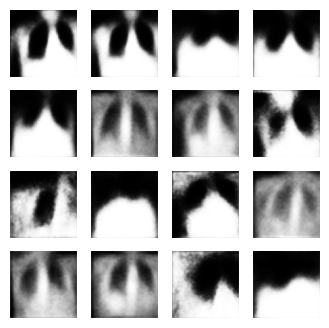

Epoch: 8, Test set ELBO: -6370.26708984375, time elapse for current epoch: 6.600932836532593


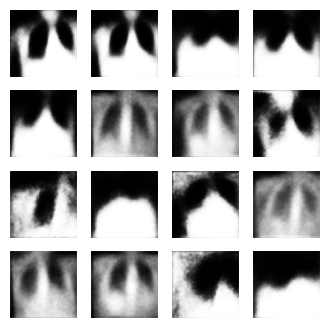

Epoch: 9, Test set ELBO: -6372.69091796875, time elapse for current epoch: 6.650894403457642


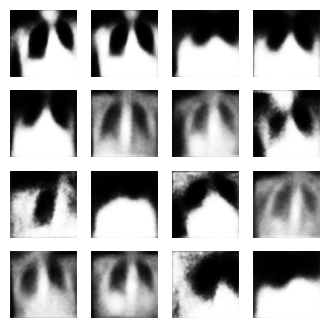

Epoch: 10, Test set ELBO: -6368.44775390625, time elapse for current epoch: 6.61582612991333


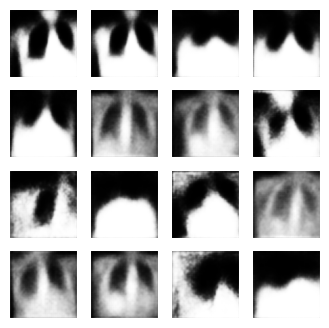

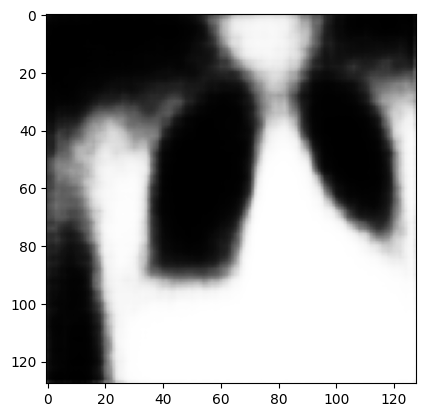

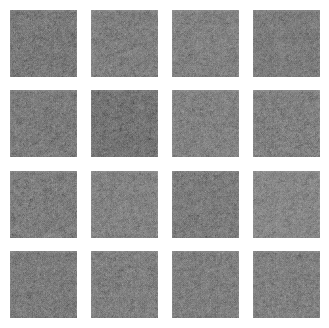

Epoch: 1, Test set ELBO: -7309.025390625, time elapse for current epoch: 10.248070240020752


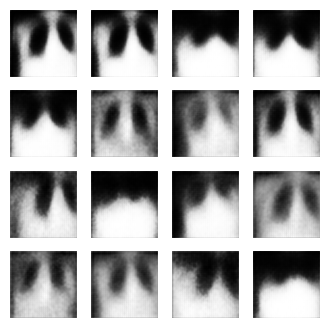

Epoch: 2, Test set ELBO: -6669.78759765625, time elapse for current epoch: 6.6601808071136475


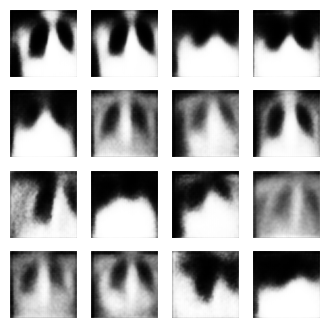

Epoch: 3, Test set ELBO: -6584.12158203125, time elapse for current epoch: 6.710010528564453


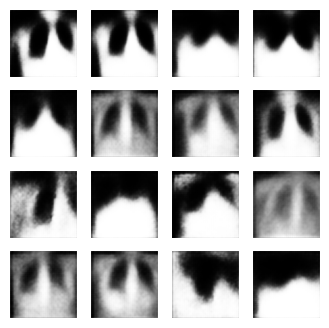

Epoch: 4, Test set ELBO: -6480.44775390625, time elapse for current epoch: 6.753514051437378


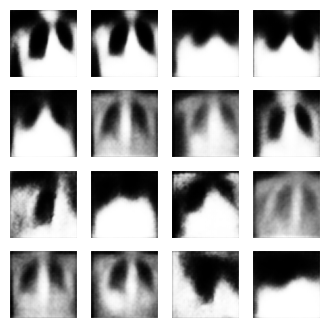

Epoch: 5, Test set ELBO: -6438.50830078125, time elapse for current epoch: 6.759973049163818


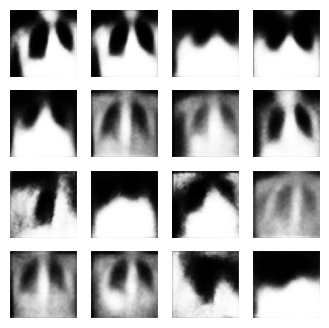

Epoch: 6, Test set ELBO: -6412.56298828125, time elapse for current epoch: 6.638216733932495


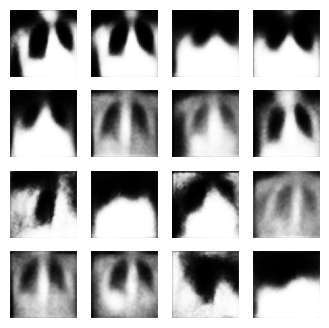

Epoch: 7, Test set ELBO: -6404.96923828125, time elapse for current epoch: 6.635068416595459


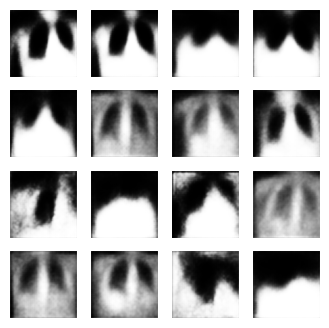

Epoch: 8, Test set ELBO: -6368.556640625, time elapse for current epoch: 6.598573923110962


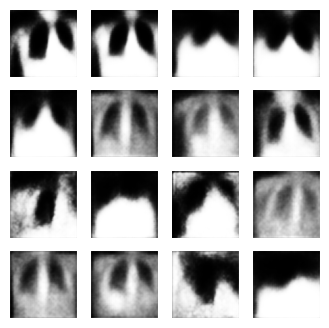

Epoch: 9, Test set ELBO: -6367.69140625, time elapse for current epoch: 6.587841987609863


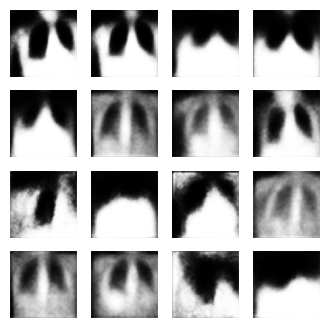

Epoch: 10, Test set ELBO: -6373.81640625, time elapse for current epoch: 6.6058127880096436


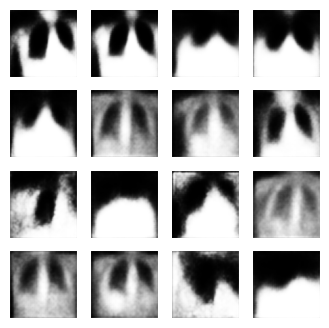

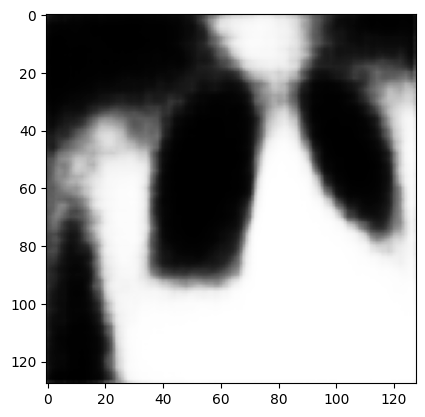

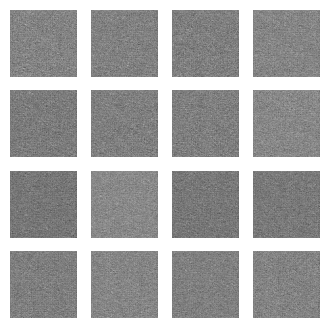

Epoch: 1, Test set ELBO: -7480.47021484375, time elapse for current epoch: 9.034963369369507


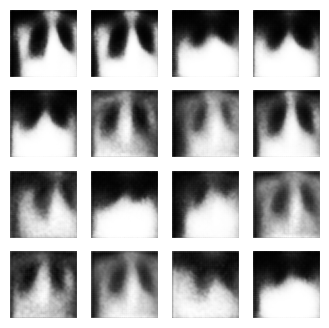

Epoch: 2, Test set ELBO: -6558.13623046875, time elapse for current epoch: 6.654750108718872


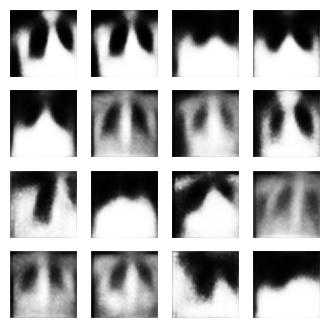

Epoch: 3, Test set ELBO: -6405.15771484375, time elapse for current epoch: 6.718316078186035


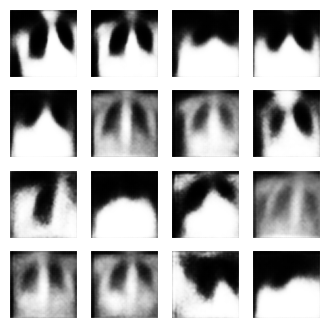

Epoch: 4, Test set ELBO: -6389.42822265625, time elapse for current epoch: 6.7351484298706055


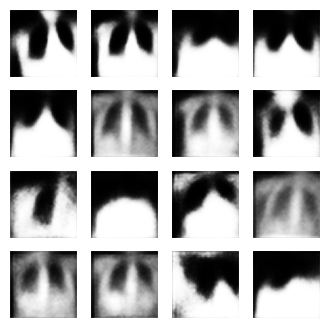

Epoch: 5, Test set ELBO: -6271.99365234375, time elapse for current epoch: 6.708639860153198


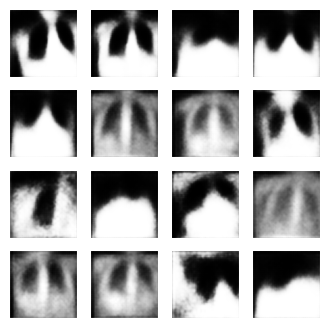

Epoch: 6, Test set ELBO: -6245.447265625, time elapse for current epoch: 10.25614070892334


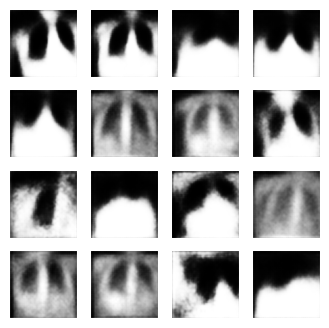

Epoch: 7, Test set ELBO: -6248.35400390625, time elapse for current epoch: 6.6231396198272705


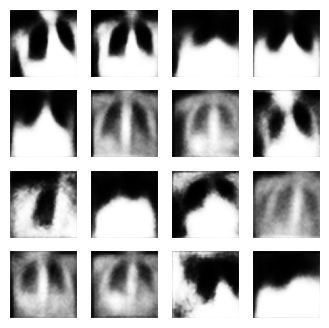

Epoch: 8, Test set ELBO: -6212.2109375, time elapse for current epoch: 6.647527694702148


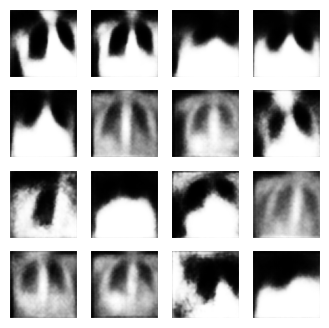

Epoch: 9, Test set ELBO: -6202.9921875, time elapse for current epoch: 6.63923192024231


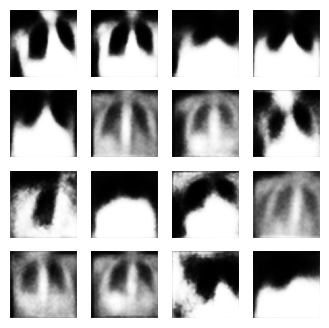

Epoch: 10, Test set ELBO: -6204.51416015625, time elapse for current epoch: 6.663801908493042


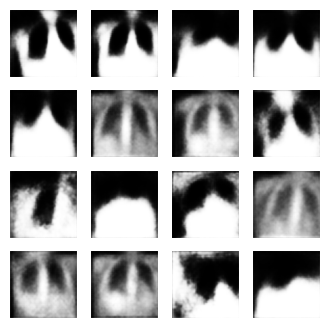

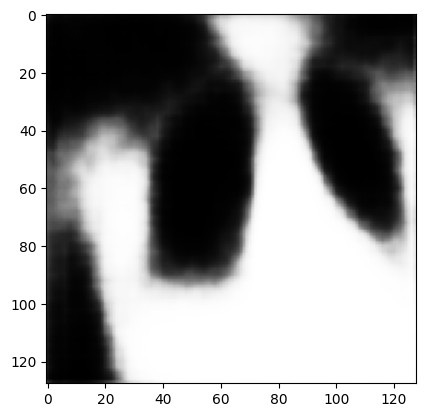

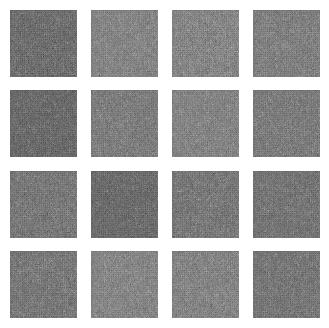

Epoch: 1, Test set ELBO: -7374.41650390625, time elapse for current epoch: 9.57198691368103


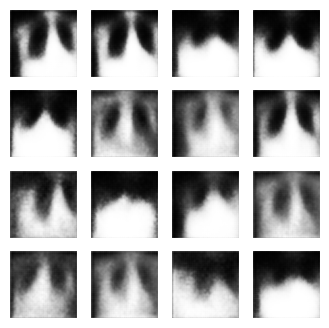

Epoch: 2, Test set ELBO: -6674.79931640625, time elapse for current epoch: 6.671271085739136


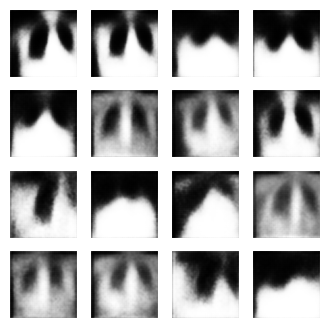

Epoch: 3, Test set ELBO: -6480.62158203125, time elapse for current epoch: 6.736899137496948


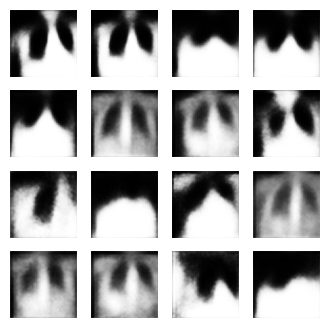

Epoch: 4, Test set ELBO: -6331.93603515625, time elapse for current epoch: 6.762739896774292


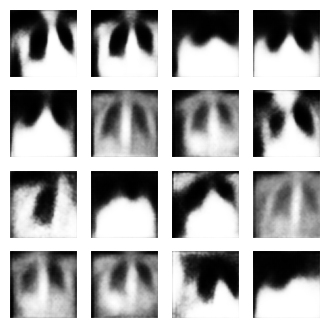

Epoch: 5, Test set ELBO: -6282.91552734375, time elapse for current epoch: 6.700847625732422


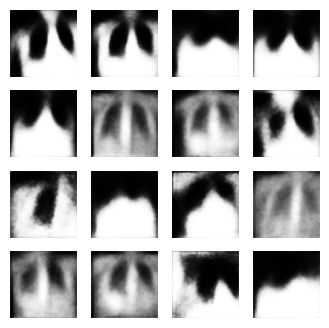

Epoch: 6, Test set ELBO: -6254.94140625, time elapse for current epoch: 6.713156700134277


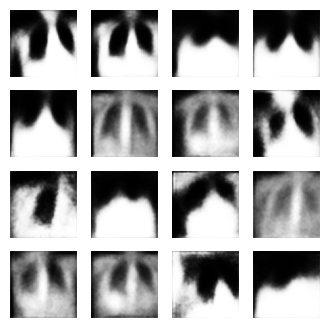

Epoch: 7, Test set ELBO: -6234.55517578125, time elapse for current epoch: 6.612777233123779


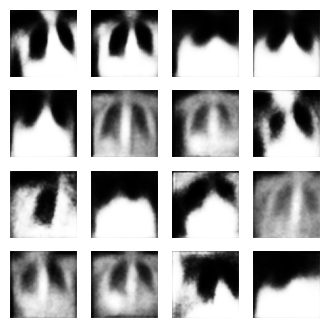

Epoch: 8, Test set ELBO: -6210.216796875, time elapse for current epoch: 6.610053777694702


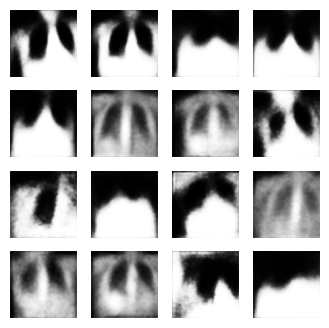

Epoch: 9, Test set ELBO: -6207.55615234375, time elapse for current epoch: 6.630204200744629


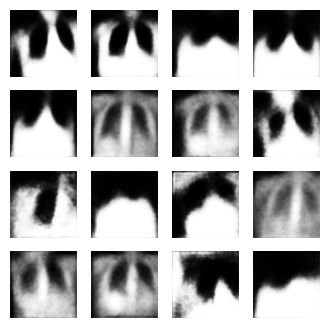

Epoch: 10, Test set ELBO: -6201.77099609375, time elapse for current epoch: 6.6424500942230225


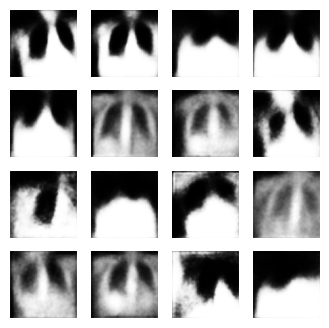

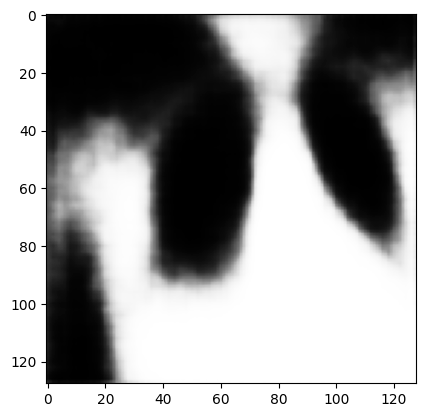

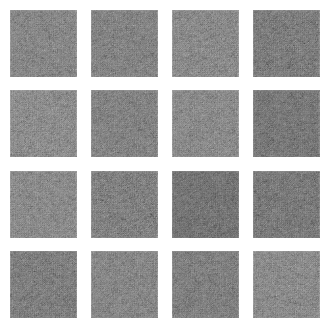

Epoch: 1, Test set ELBO: -7261.88330078125, time elapse for current epoch: 8.814862251281738


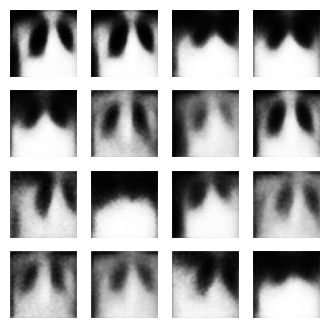

Epoch: 2, Test set ELBO: -6510.33203125, time elapse for current epoch: 6.695383310317993


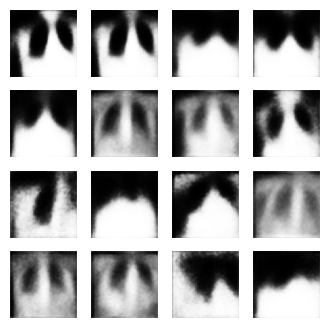

Epoch: 3, Test set ELBO: -6416.04638671875, time elapse for current epoch: 6.7258477210998535


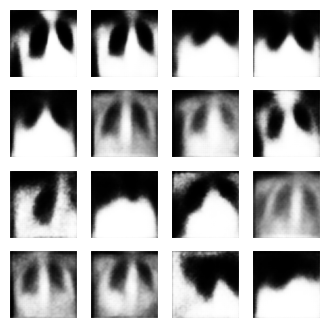

Epoch: 4, Test set ELBO: -6302.77783203125, time elapse for current epoch: 6.814750671386719


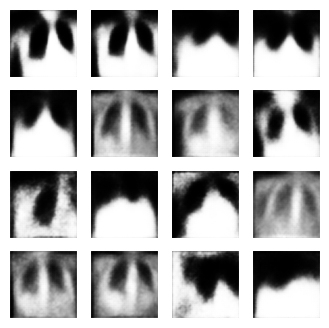

Epoch: 5, Test set ELBO: -6264.17431640625, time elapse for current epoch: 6.716792106628418


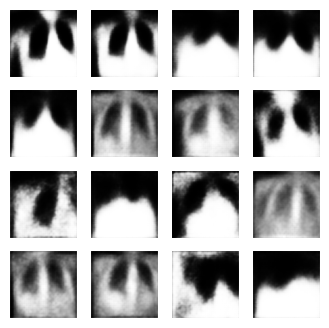

Epoch: 6, Test set ELBO: -6240.18017578125, time elapse for current epoch: 6.680759429931641


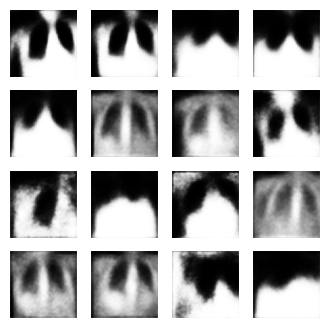

Epoch: 7, Test set ELBO: -6217.55859375, time elapse for current epoch: 6.653683423995972


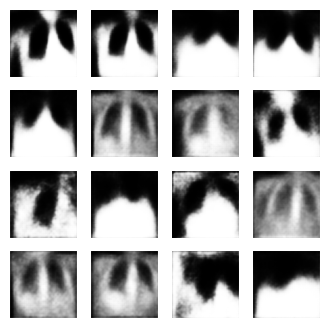

Epoch: 8, Test set ELBO: -6205.92431640625, time elapse for current epoch: 6.635350704193115


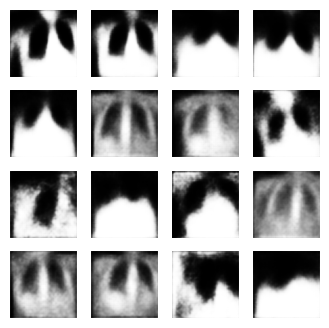

Epoch: 9, Test set ELBO: -6193.22900390625, time elapse for current epoch: 6.716188192367554


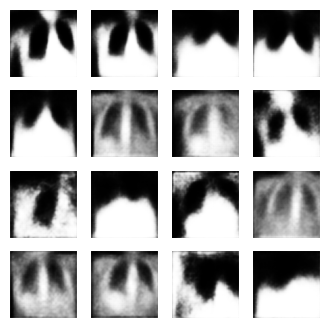

Epoch: 10, Test set ELBO: -6184.57470703125, time elapse for current epoch: 6.658364772796631


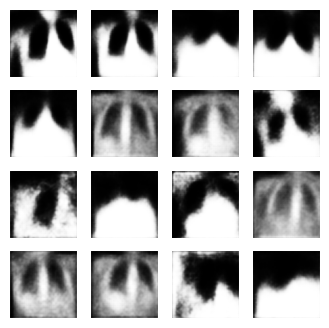

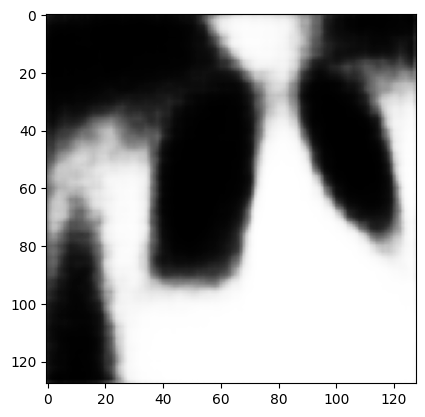

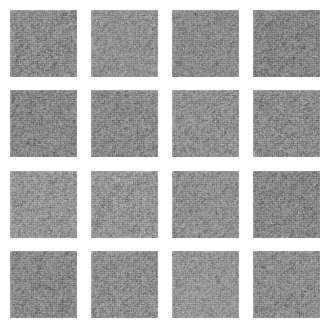

Epoch: 1, Test set ELBO: -7199.60302734375, time elapse for current epoch: 10.24150562286377


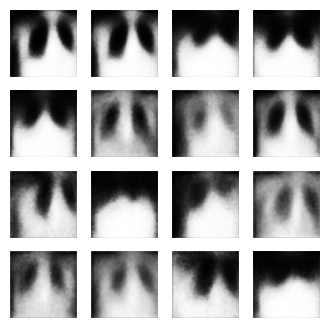

Epoch: 2, Test set ELBO: -6546.82275390625, time elapse for current epoch: 6.6523072719573975


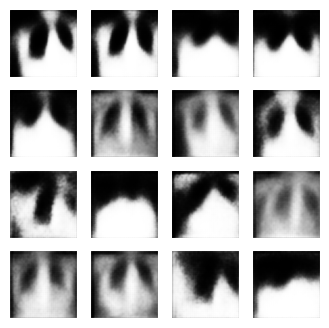

Epoch: 3, Test set ELBO: -6409.15380859375, time elapse for current epoch: 6.754327297210693


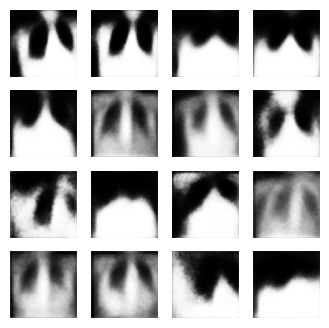

Epoch: 4, Test set ELBO: -6328.45947265625, time elapse for current epoch: 10.247346878051758


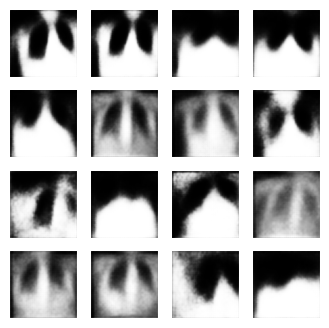

Epoch: 5, Test set ELBO: -6271.984375, time elapse for current epoch: 6.674891233444214


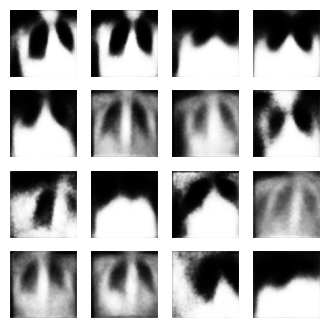

Epoch: 6, Test set ELBO: -6271.93603515625, time elapse for current epoch: 6.665199041366577


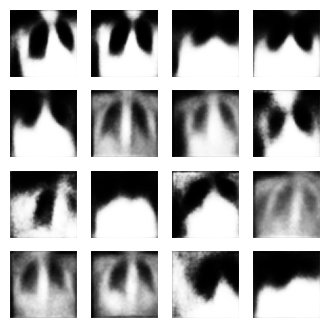

Epoch: 7, Test set ELBO: -6232.3671875, time elapse for current epoch: 6.644775152206421


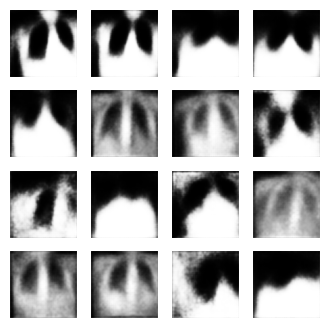

Epoch: 8, Test set ELBO: -6213.06640625, time elapse for current epoch: 6.672787189483643


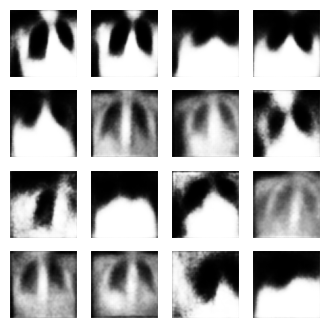

Epoch: 9, Test set ELBO: -6199.33349609375, time elapse for current epoch: 6.646717071533203


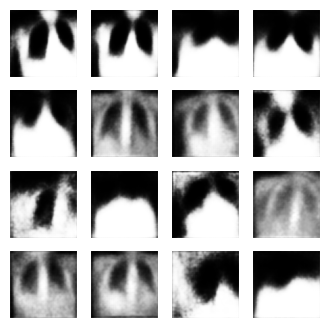

Epoch: 10, Test set ELBO: -6193.03955078125, time elapse for current epoch: 6.660400629043579


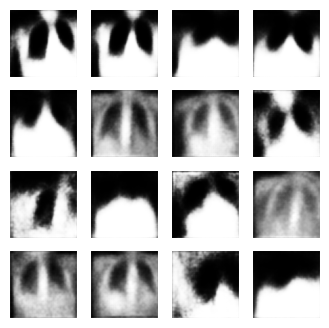

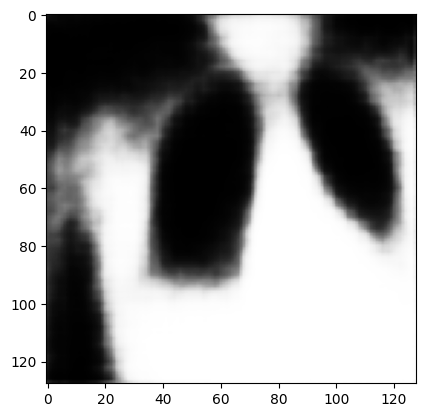

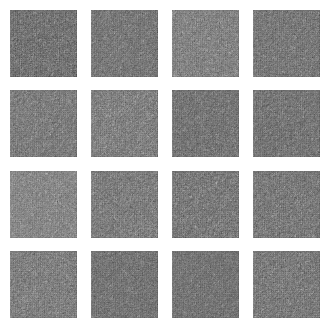

Epoch: 1, Test set ELBO: -7421.63916015625, time elapse for current epoch: 9.557808876037598


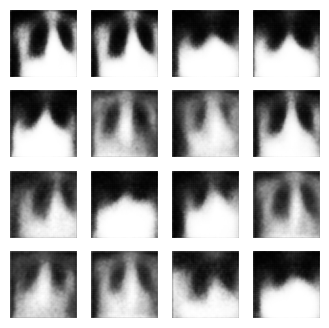

Epoch: 2, Test set ELBO: -6591.72509765625, time elapse for current epoch: 6.6514856815338135


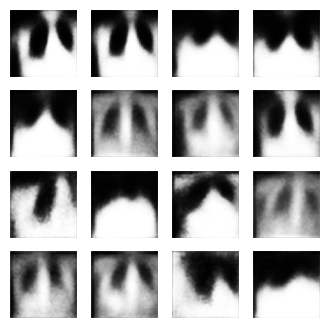

Epoch: 3, Test set ELBO: -6440.43896484375, time elapse for current epoch: 6.703936576843262


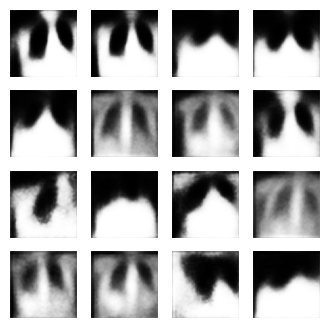

Epoch: 4, Test set ELBO: -6338.46728515625, time elapse for current epoch: 6.690097093582153


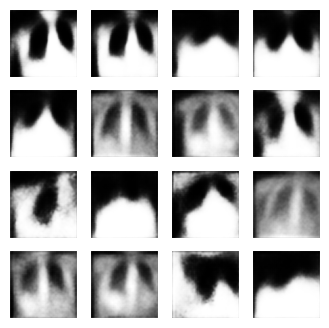

Epoch: 5, Test set ELBO: -6294.626953125, time elapse for current epoch: 6.693617820739746


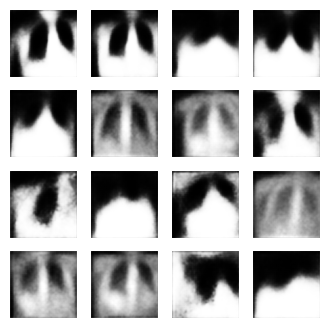

Epoch: 6, Test set ELBO: -6257.87548828125, time elapse for current epoch: 6.730486154556274


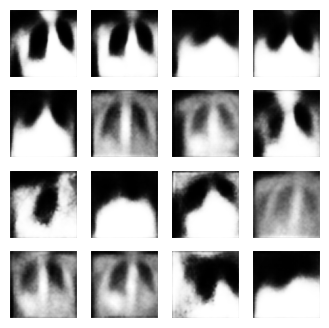

Epoch: 7, Test set ELBO: -6249.06591796875, time elapse for current epoch: 6.642715215682983


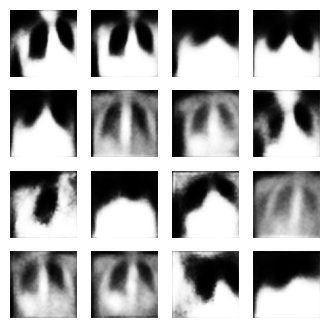

Epoch: 8, Test set ELBO: -6238.072265625, time elapse for current epoch: 6.644384860992432


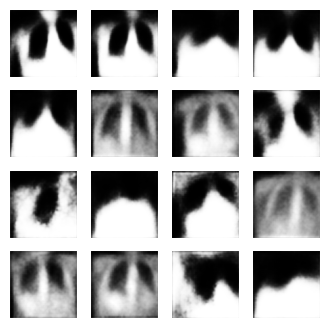

Epoch: 9, Test set ELBO: -6218.154296875, time elapse for current epoch: 6.632877588272095


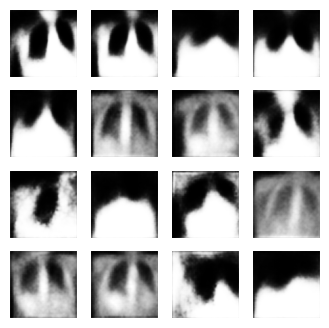

Epoch: 10, Test set ELBO: -6201.1171875, time elapse for current epoch: 6.628458499908447


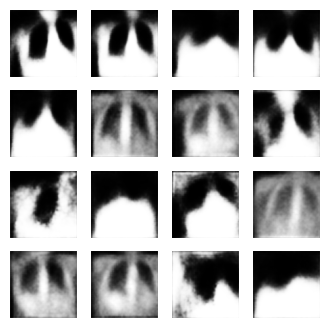

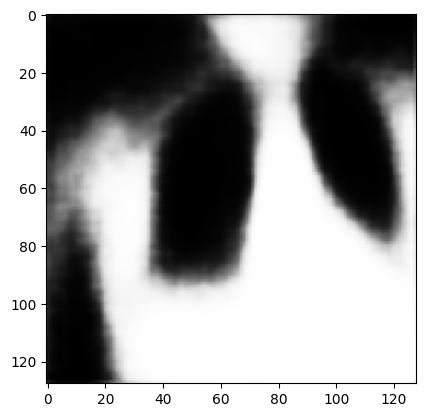

In [25]:


for latentVar in [6,8,10]:
  numKfold = 5
  epochs = 10
  latent_dim = latentVar
  num_examples_to_generate = 16
  batchSize = 31
  totalError = np.empty(shape=(numKfold,batchSize-1))
  for kFold in range(numKfold):
    #________MODEL___________
    class CVAE(tf.keras.Model):
      """Convolutional variational autoencoder."""

      def __init__(self, latent_dim):
        super(CVAE, self).__init__()
        self.latent_dim = latent_dim
        self.encoder = tf.keras.Sequential(
            [
                tf.keras.layers.InputLayer(input_shape=(128, 128, 1)),
                tf.keras.layers.Conv2D(
                    filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
                tf.keras.layers.Conv2D(
                    filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
                tf.keras.layers.Flatten(),
                # No activation
                tf.keras.layers.Dense(latent_dim + latent_dim),
            ]
        )

        self.decoder = tf.keras.Sequential(
            [
                tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
                tf.keras.layers.Dense(units=32*32*32, activation=tf.nn.relu),
                tf.keras.layers.Reshape(target_shape=(32, 32, 32)),
                tf.keras.layers.Conv2DTranspose(
                    filters=64, kernel_size=3, strides=2, padding='same',
                    activation='relu'),
                tf.keras.layers.Conv2DTranspose(
                    filters=32, kernel_size=3, strides=2, padding='same',
                    activation='relu'),
                # No activation
                tf.keras.layers.Conv2DTranspose(
                    filters=1, kernel_size=3, strides=1, padding='same'),
            ]
        )

      @tf.function
      def sample(self, eps=None):
        if eps is None:
          eps = tf.random.normal(shape=(100, self.latent_dim))
        return self.decode(eps, apply_sigmoid=True)

      def encode(self, x):
        mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
        return mean, logvar

      def reparameterize(self, mean, logvar):
        eps = tf.random.normal(shape=mean.shape)
        return eps * tf.exp(logvar * .5) + mean

      def decode(self, z, apply_sigmoid=False):
        logits = self.decoder(z)
        if apply_sigmoid:
          probs = tf.sigmoid(logits)
          return probs
        return logits

    optimizer = tf.keras.optimizers.Adam(1e-4)


    def log_normal_pdf(sample, mean, logvar, raxis=1):
      log2pi = tf.math.log(2. * np.pi)
      return tf.reduce_sum(
          -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
          axis=raxis)


    def compute_loss(model, x):
      mean, logvar = model.encode(x)
      z = model.reparameterize(mean, logvar)
      x_logit = model.decode(z)
      cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
      logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2, 3])
      logpz = log_normal_pdf(z, 0., 0.)
      logqz_x = log_normal_pdf(z, mean, logvar)
      return -tf.reduce_mean(logpx_z + logpz - logqz_x)


    @tf.function
    def train_step(model, x, optimizer):
      """Executes one training step and returns the loss.

      This function computes the loss and gradients, and uses the latter to
      update the model's parameters.
      """
      with tf.GradientTape() as tape:
        loss = compute_loss(model, x)
      gradients = tape.gradient(loss, model.trainable_variables)
      optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    random_vector_for_generation = tf.random.normal(
      shape=[num_examples_to_generate, latent_dim])
    model = CVAE(latent_dim)

    assert batch_size >= num_examples_to_generate
    for test_batch in test_dataset.take(1):
      test_sample = test_batch[0:num_examples_to_generate, :, :, :]
    #_______________

    generate_and_save_images(model, 0, test_sample)

    for epoch in range(1, epochs + 1):
      start_time = time.time()
      for train_x in train_dataset:
        train_step(model, train_x, optimizer)
      end_time = time.time()

      loss = tf.keras.metrics.Mean()
      for test_x in test_dataset:
        loss(compute_loss(model, test_x))
      elbo = -loss.result()
      #display.clear_output(wait=False)
      print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
            .format(epoch, elbo, end_time - start_time))
      generate_and_save_images(model, epoch, test_sample)

    OrigionalImages = np.empty(shape=(batchSize, 128,128))
    VAEGeneratedImages = np.empty(shape=(batchSize, 128,128))

    for imageNum in range(batchSize):
      #For recreating images from testing set to compare to VAE produced
      test_image = test_batch[imageNum, :, :,:].numpy()
      normalized_image = (test_image-np.min(test_image))/(np.max(test_image)-np.min(test_image))
      OrigionalImages[imageNum] = test_image.reshape((128, 128))
      #For producing images that have been encoded and decoded by the VAE
      VAEAlteredImage = test_batch[imageNum:imageNum+1, :, :,:].numpy()
      mean, logvar = model.encode(VAEAlteredImage)
      z = model.reparameterize(mean, logvar)
      predictions = model.sample(z)
      VAEGeneratedImages[imageNum] = tf.reshape(predictions[0], (128, 128))

    plt.imshow(OrigionalImages[0],cmap='Greys_r')
    plt.imshow( VAEGeneratedImages[0],cmap='Greys_r')

    #For directly comparing the error between the origional and produce dimages
    for imageNum in range(batchSize -1 ):
      for col in range(128):
        for row in range(128):
          totalError[kFold, imageNum] += abs(OrigionalImages[imageNum][col,row] - VAEGeneratedImages[imageNum][col,row])
  np.save("/content/drive/MyDrive/AllDICOM/Model" + str(latentVar), totalError)




(-0.5, 399.5, 399.5, -0.5)

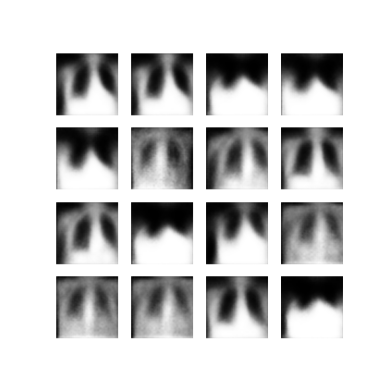

In [ ]:
plt.imshow(display_image(epoch))
plt.axis('off')  # Display images

### Display an animated GIF of all the saved images

In [ ]:
anim_file = 'cvae.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

<ipython-input-13-a6dbd3b71488>:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
<ipython-input-13-a6dbd3b71488>:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)



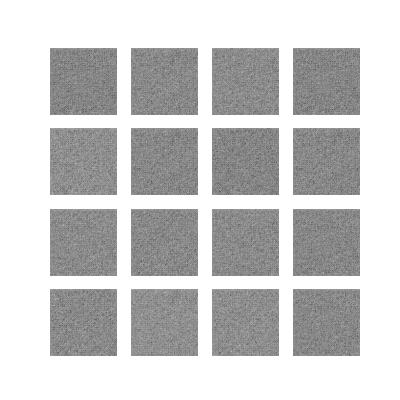

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

### Display a 2D manifold of digits from the latent space

Running the code below will show a continuous distribution of the different digit classes, with each digit morphing into another across the 2D latent space. Use [TensorFlow Probability](https://www.tensorflow.org/probability) to generate a standard normal distribution for the latent space.

In [ ]:
def plot_latent_images(model, n, digit_size=128):
  """Plots n x n digit images decoded from the latent space."""

  norm = tfp.distributions.Normal(0, 1)
  grid_x = norm.quantile(np.linspace(0.05, 0.95, n))
  grid_y = norm.quantile(np.linspace(0.05, 0.95, n))
  image_width = digit_size*n
  image_height = image_width
  image = np.zeros((image_height, image_width))

  for i, yi in enumerate(grid_x):
    for j, xi in enumerate(grid_y):
      z = np.array([[xi, yi]])
      x_decoded = model.sample(z)
      digit = tf.reshape(x_decoded[0], (digit_size, digit_size))
      image[i * digit_size: (i + 1) * digit_size,
            j * digit_size: (j + 1) * digit_size] = digit.numpy()

  plt.figure(figsize=(10, 10))
  plt.imshow(image, cmap='Greys_r')
  plt.axis('Off')
  plt.show()

In [ ]:


plot_latent_images(model, 20)

TypeError: Could not locate class 'CVAE'. Make sure custom classes are decorated with `@keras.saving.register_keras_serializable()`. Full object config: {'module': None, 'class_name': 'CVAE', 'config': {'latent_dim': 8}, 'registered_name': 'CVAE'}

In [ ]:
def origional_images(test_batch):
  OrigionalImages = np.empty(test_size)
  for imageNum in range(test_size):
    test_image = test_batch[imageNum, :, :,:].numpy()
    normalized_image = (test_image-np.min(test_image))/(np.max(test_image)-np.min(test_image))
    OrigionalImages[imageNum] = test_sample.reshape((128, 128))
  return OrigionalImages
  #plt.imshow(OrigionalImages[0],cmap='Greys_r')

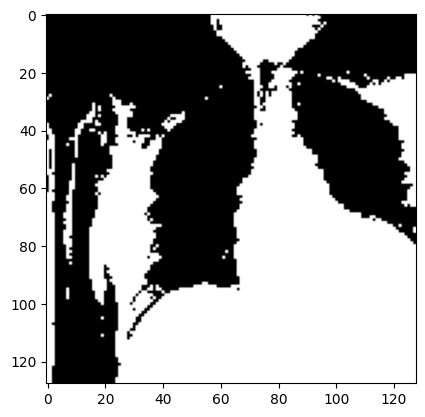

In [12]:
plt.imshow(OrigionalImages[0],cmap='Greys_r')

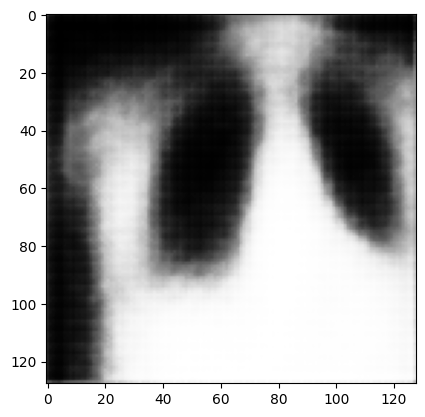

In [13]:
plt.imshow(VAEGeneratedImages[0],cmap='Greys_r')

In [ ]:
def vae_generated_images(model, test_size):
  VAEAlteredImages = test_batch[0:test_size, :, :,:].numpy()
  mean, logvar = model.encode(VAEAlteredImages)
  z = model.reparameterize(mean, logvar)
  predictions = model.sample(z)
  results = tf.reshape(predictions[0], (128, 128))
  return results
  #plt.imshow(results[0],cmap='Greys_r')

In [ ]:
def image_error_comparison(model, OrigionalImages, VAEImages):
  totalError = []
  for imageNum in range(31):
    for col in range(128):
      for row in range(128):
        totalError[imageNum] += abs(OrigionalImages[imageNum][col,row] - VAEImages[imageNum][col,row])
  return totalError

(array([3., 3., 0., 1., 0., 2., 1., 3., 2., 3., 1., 3., 2., 2., 0., 0., 0.,
        0., 0., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 1.]),
 array([ 1972.82171445,  2375.65683593,  2778.49195742,  3181.32707891,
         3584.1622004 ,  3986.99732189,  4389.83244338,  4792.66756487,
         5195.50268636,  5598.33780785,  6001.17292934,  6404.00805083,
         6806.84317231,  7209.6782938 ,  7612.51341529,  8015.34853678,
         8418.18365827,  8821.01877976,  9223.85390125,  9626.68902274,
        10029.52414423, 10432.35926572, 10835.19438721, 11238.02950869,
        11640.86463018, 12043.69975167, 12446.53487316, 12849.36999465,
        13252.20511614, 13655.04023763, 14057.87535912]),
 <BarContainer object of 30 artists>)

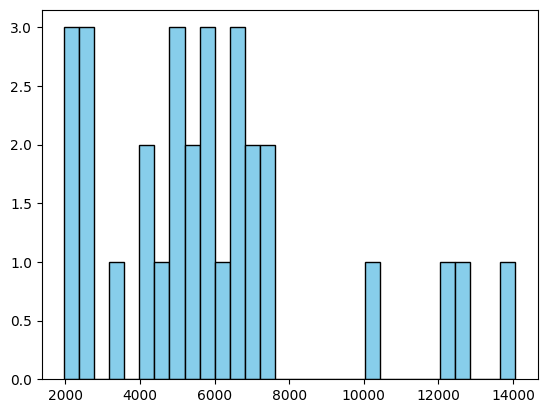

In [ ]:

plt.hist(totalError, bins=30, color='skyblue', edgecolor='black')

(array([1., 4., 1., 1., 0., 1., 0., 1., 0., 2., 0., 2., 1., 1., 0., 0., 0.,
        0., 0., 0., 1., 1., 1., 1., 3., 2., 1., 1., 1., 3.]),
 array([1948.46911452, 2126.91914068, 2305.36916684, 2483.819193  ,
        2662.26921916, 2840.71924532, 3019.16927148, 3197.61929764,
        3376.0693238 , 3554.51934996, 3732.96937612, 3911.41940228,
        4089.86942844, 4268.3194546 , 4446.76948076, 4625.21950692,
        4803.66953308, 4982.11955924, 5160.5695854 , 5339.01961156,
        5517.46963772, 5695.91966388, 5874.36969004, 6052.8197162 ,
        6231.26974236, 6409.71976852, 6588.16979468, 6766.61982084,
        6945.069847  , 7123.51987316, 7301.96989932]),
 <BarContainer object of 30 artists>)

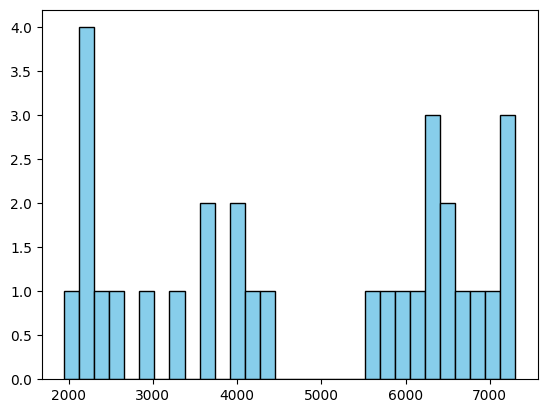

In [21]:
totalError = np.load("/content/drive/MyDrive/AllDICOM/Model2.npy")
plt.hist(totalError[0], bins=30, color='skyblue', edgecolor='black')

(array([1., 3., 2., 0., 1., 1., 0., 1., 0., 0., 2., 2., 0., 1., 1., 0., 0.,
        0., 0., 1., 0., 1., 1., 0., 3., 2., 1., 2., 1., 3.]),
 array([1868.16304476, 2046.79308054, 2225.42311632, 2404.0531521 ,
        2582.68318788, 2761.31322366, 2939.94325944, 3118.57329522,
        3297.203331  , 3475.83336678, 3654.46340256, 3833.09343835,
        4011.72347413, 4190.35350991, 4368.98354569, 4547.61358147,
        4726.24361725, 4904.87365303, 5083.50368881, 5262.13372459,
        5440.76376037, 5619.39379616, 5798.02383194, 5976.65386772,
        6155.2839035 , 6333.91393928, 6512.54397506, 6691.17401084,
        6869.80404662, 7048.4340824 , 7227.06411818]),
 <BarContainer object of 30 artists>)

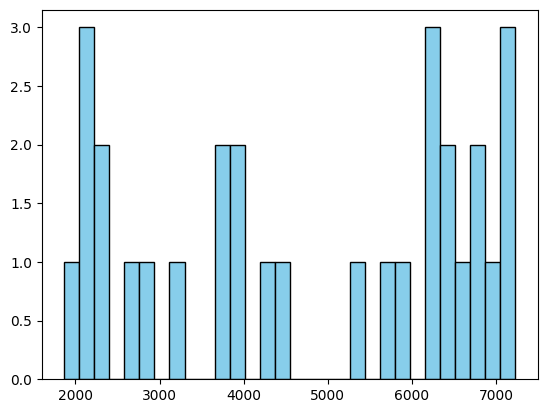

In [24]:
totalError = np.load("/content/drive/MyDrive/AllDICOM/Model2.npy")
plt.hist(totalError[3], bins=30, color='skyblue', edgecolor='black')

(array([3., 3., 0., 1., 0., 2., 1., 3., 2., 3., 1., 3., 2., 2., 0., 0., 0.,
        0., 0., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 1.]),
 array([ 1972.82171445,  2375.65683593,  2778.49195742,  3181.32707891,
         3584.1622004 ,  3986.99732189,  4389.83244338,  4792.66756487,
         5195.50268636,  5598.33780785,  6001.17292934,  6404.00805083,
         6806.84317231,  7209.6782938 ,  7612.51341529,  8015.34853678,
         8418.18365827,  8821.01877976,  9223.85390125,  9626.68902274,
        10029.52414423, 10432.35926572, 10835.19438721, 11238.02950869,
        11640.86463018, 12043.69975167, 12446.53487316, 12849.36999465,
        13252.20511614, 13655.04023763, 14057.87535912]),
 <BarContainer object of 30 artists>)

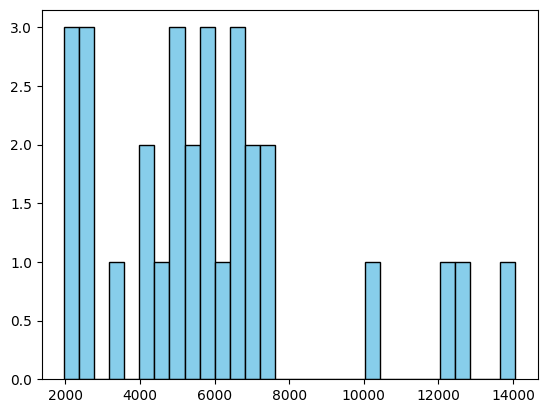

In [ ]:
totalError = np.load("/content/drive/MyDrive/AllDICOM/Model8.npy")
plt.hist(totalError, bins=30, color='skyblue', edgecolor='black')

## Next steps

This tutorial has demonstrated how to implement a convolutional variational autoencoder using TensorFlow.

As a next step, you could try to improve the model output by increasing the network size.
For instance, you could try setting the `filter` parameters for each of the `Conv2D` and `Conv2DTranspose` layers to 512.
Note that in order to generate the final 2D latent image plot, you would need to keep `latent_dim` to 2. Also, the training time would increase as the network size increases.

You could also try implementing a VAE using a different dataset, such as CIFAR-10.

VAEs can be implemented in several different styles and of varying complexity. You can find additional implementations in the following sources:
- [Variational AutoEncoder (keras.io)](https://keras.io/examples/generative/vae/)
- [VAE example from "Writing custom layers and models" guide (tensorflow.org)](https://www.tensorflow.org/guide/keras/custom_layers_and_models#putting_it_all_together_an_end-to-end_example)
- [TFP Probabilistic Layers: Variational Auto Encoder](https://www.tensorflow.org/probability/examples/Probabilistic_Layers_VAE)

If you'd like to learn more about the details of VAEs, please refer to [An Introduction to Variational Autoencoders](https://arxiv.org/abs/1906.02691).